In [8]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, trimmed_clustering, evaluate_clustering, create_cluster_dataset

# data

In [9]:
np.random.seed(42)

In [10]:
N_CLUSTER = 3

In [11]:
CORRELATION = 0.2

In [12]:
NOISE_STD = 9

In [ ]:
N_SAMPLE = 5000

In [13]:
N_FEATURES = 20

In [ ]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[1.0, 5.5, 0.5],
                             separation_factor=3.0,
                             sample_distribution=[2500, 1500, 1000],
                             random_state=42)

In [15]:
X.shape

(5000, 21)

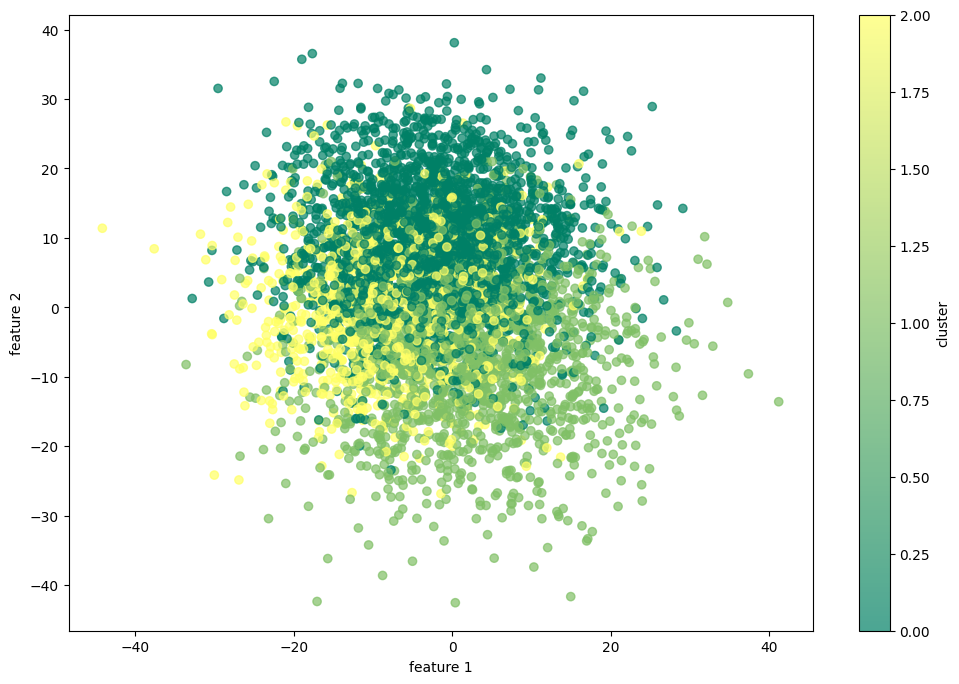

In [16]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'],c=X['target'],cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

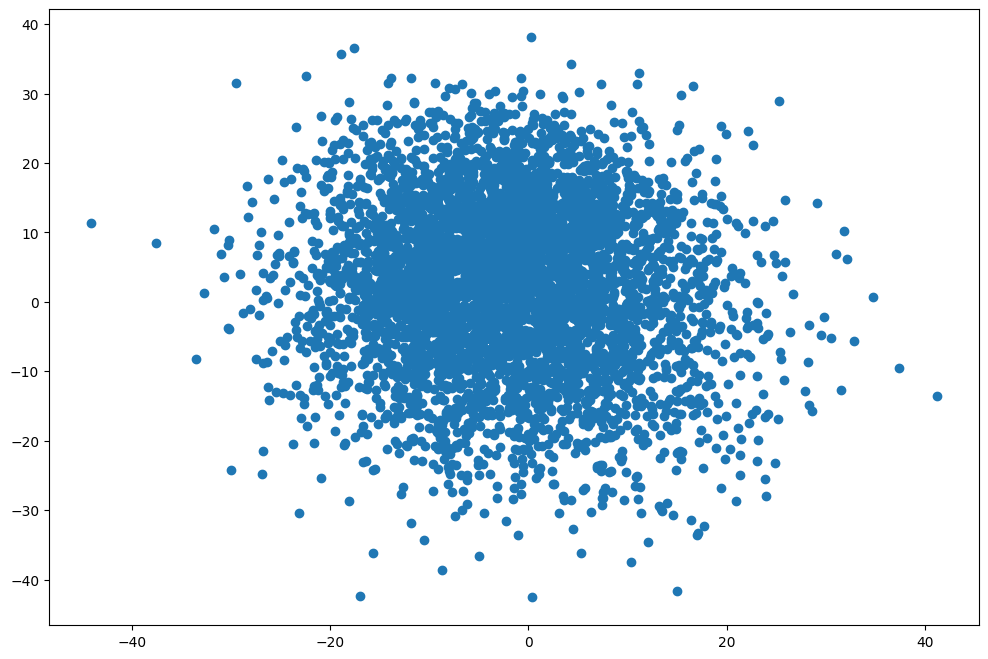

In [17]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [18]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [19]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20
var_1,1.000000,-0.082125,0.036788,-0.131602,0.074843,0.045435,-0.040561,-0.014301,0.007664,-0.050905,-0.077265,-0.140403,-0.204160,0.014951,0.069466,-0.037027,0.066364,-0.019039,0.140971,0.029601
var_2,-0.082125,1.000000,0.245608,0.096877,-0.179166,-0.324844,-0.097920,0.227313,0.018402,0.319578,-0.266687,0.331146,0.323739,-0.332046,-0.364348,-0.302648,0.005143,0.243825,-0.064767,-0.083913
var_3,0.036788,0.245608,1.000000,-0.071084,-0.104854,-0.238520,-0.107785,0.177247,0.026665,0.252708,-0.315079,0.155725,0.104501,-0.265936,-0.226782,-0.310967,0.085004,0.168724,0.089023,-0.044016
var_4,-0.131602,0.096877,-0.071084,1.000000,-0.068504,-0.019874,0.017526,0.007809,0.010996,0.037323,0.076693,0.149588,0.201952,-0.038436,-0.100769,0.009771,-0.059760,0.047342,-0.139999,-0.063865
var_5,0.074843,-0.179166,-0.104854,-0.068504,1.000000,0.155559,0.035982,-0.083812,-0.024727,-0.131274,0.104279,-0.151177,-0.167726,0.138082,0.150837,0.133370,0.026714,-0.085419,0.049810,0.041078
var_6,0.045435,-0.324844,-0.238520,-0.019874,0.155559,1.000000,0.112709,-0.174019,-0.019793,-0.265056,0.273772,-0.244168,-0.213305,0.285906,0.272820,0.289284,-0.018446,-0.196502,0.015110,0.060971
var_7,-0.040561,-0.097920,-0.107785,0.017526,0.035982,0.112709,1.000000,-0.074598,0.003320,-0.137206,0.157302,-0.076110,-0.044707,0.114900,0.128491,0.101862,-0.054607,-0.114244,-0.032051,0.003666
var_8,-0.014301,0.227313,0.177247,0.007809,-0.083812,-0.174019,-0.074598,1.000000,0.041000,0.194466,-0.211355,0.148235,0.153379,-0.205743,-0.171664,-0.201220,0.016513,0.150951,0.006155,-0.057791
var_9,0.007664,0.018402,0.026665,0.010996,-0.024727,-0.019793,0.003320,0.041000,1.000000,0.010342,-0.055610,0.009071,0.000587,-0.029083,-0.026099,-0.055159,0.022479,0.020982,0.034446,0.016174
var_10,-0.050905,0.319578,0.252708,0.037323,-0.131274,-0.265056,-0.137206,0.194466,0.010342,1.000000,-0.321549,0.272972,0.226269,-0.320806,-0.334075,-0.315979,0.037330,0.212757,-0.029626,-0.100214


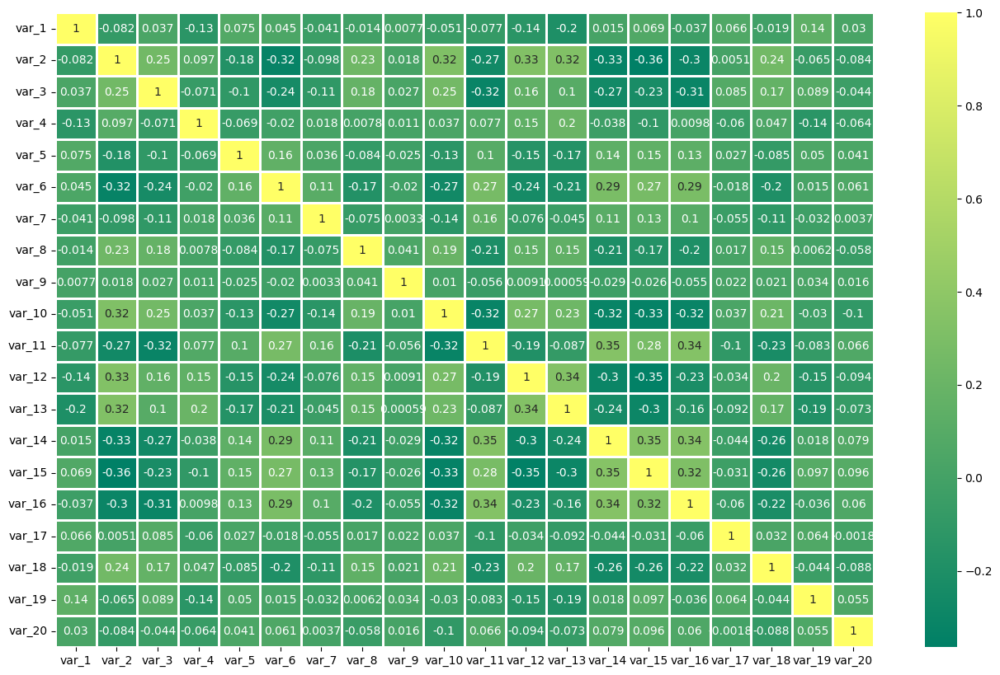

In [20]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

## data standardization

In [21]:
X_values = corr_dataset.iloc[:,:-1].values

In [22]:
y_values = corr_dataset.iloc[:,-1].values

In [23]:
scaler = StandardScaler()

In [24]:
X_values = scaler.fit_transform(X_values)

In [25]:
np.mean(X_values),np.std(X_values)

(1.9824142327706796e-16, 1.0000000000000002)

In [26]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.840454,-1.188212,-0.150969,-0.754624,-0.618768,-0.023918,0.040065,-1.182301,-0.105965,-0.953441,0.972312,-0.915043,-2.677156,1.602219,0.949381,0.129644,-1.183725,-0.606535,-0.305246,-1.863007
1,-0.935452,0.811450,2.479081,0.104547,0.456593,-1.221744,-0.855261,-1.009428,0.557919,1.313562,-0.564305,0.756072,0.445401,0.867611,-0.706527,-0.637801,-0.639641,0.784905,0.766471,-0.072158
2,-0.438209,-0.689143,-2.304578,2.232614,0.915511,-0.113589,0.890568,0.361395,0.090207,0.801679,-0.686756,0.479160,-0.471859,0.807746,0.756459,0.021245,0.259752,-1.537078,-0.954999,-0.572377
3,0.732341,0.329676,-0.216738,-2.274124,1.622357,0.558693,1.378081,-1.501675,-0.041633,-2.165870,0.363527,-1.361790,-1.321257,0.631459,2.421177,0.633383,1.681411,-0.375695,2.216317,1.196877
4,-0.731756,2.424882,-1.035321,0.165334,-2.127532,-0.295124,-1.959587,1.140685,1.053909,0.926713,-0.871505,0.704388,0.671239,-0.594007,-0.010352,0.295304,1.522288,0.325666,1.142096,0.342568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2.062925,0.608538,0.703684,-0.196502,0.997658,0.847443,0.580478,-0.147232,1.009524,-0.740316,1.003762,-1.433880,-0.653523,0.098601,-0.135992,-0.408710,-1.047742,-0.703835,-0.594890,-2.041466
4996,0.576460,0.206868,0.928020,1.029801,0.198558,-0.328824,0.963441,-0.200541,0.603672,-0.003512,1.553346,-0.936004,-0.029556,0.035865,-0.060671,0.001048,-0.077561,0.129441,-0.606850,-0.570171
4997,1.411561,-0.502905,0.852578,0.921266,1.085946,-0.061775,-1.034339,-0.657951,0.274663,-0.195771,0.209019,0.341179,0.102730,-0.862977,-0.368236,0.220455,0.388971,0.239485,-0.208037,-1.439139
4998,-0.624392,0.262602,0.526711,0.004471,-0.466784,-0.735461,-0.608032,-0.102555,0.769789,0.280309,-1.290456,0.592622,0.581732,0.469958,-1.185247,0.939537,-0.165857,0.882627,-1.594453,0.719129


## pca 

In [27]:
pca_general = PCA()

In [28]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [29]:
explained_variance = pca_general.explained_variance_ratio_

In [30]:
explained_variance

array([0.20011889, 0.08800893, 0.05163141, 0.04980674, 0.04873625,
       0.04654807, 0.04575043, 0.04414237, 0.0428196 , 0.04245382,
       0.04043611, 0.03754204, 0.03667246, 0.03571019, 0.03373986,
       0.03269396, 0.03185129, 0.03117371, 0.03028489, 0.02987898])

In [31]:
eigenvalues = pca_general.explained_variance_

In [32]:
pd.DataFrame(eigenvalues)

,0
0,4.003178
1,1.760531
2,1.032835
3,0.996334
4,0.974920
5,0.931148
6,0.915192
7,0.883024
8,0.856563
9,0.849246


In [33]:
eigenvectors = pca_general.components_

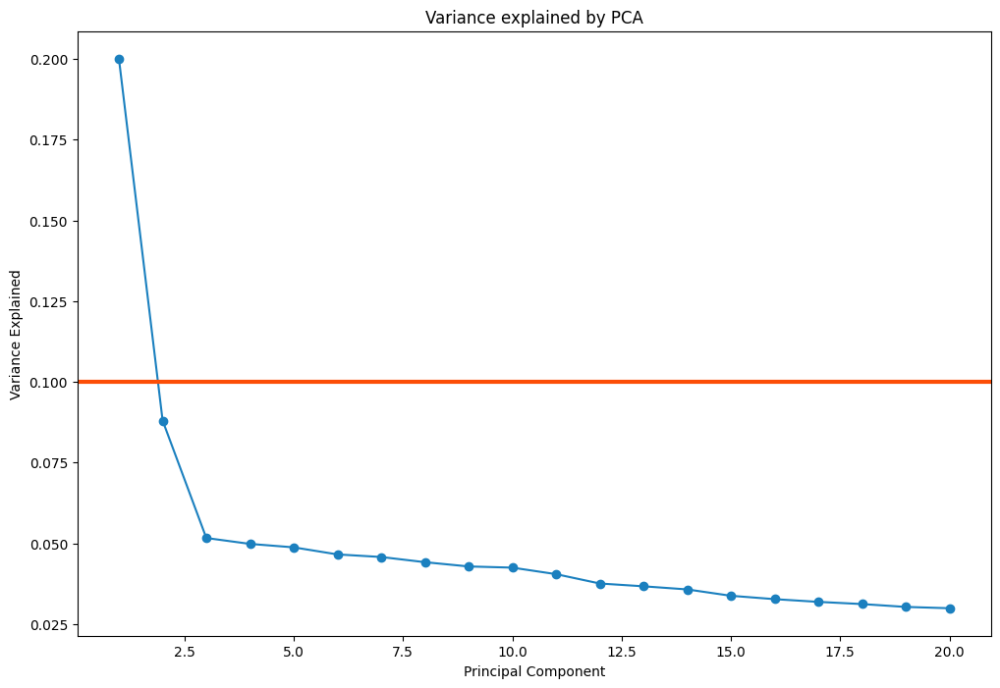

In [34]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [35]:
pca = PCA(n_components=3)

In [36]:
X_pca = pca.fit_transform(X_values)

In [37]:
pd.DataFrame(X_pca).head(8)

,0,1,2
0,-2.983210,0.695365,-0.663311
1,2.266142,0.421426,0.307731
2,-1.081655,-1.697019,-0.331886
3,-3.888401,3.018332,0.451778
4,2.523493,0.171564,1.011235
5,-2.717405,2.106805,1.407284
6,1.404935,0.703246,0.278885
7,1.684696,1.087841,-0.350086


In [38]:
principal_df = pd.DataFrame(data = X_pca,columns = ['principal component 1','principal component 2','principal component 3'])

In [39]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [40]:
final_df

,principal component 1,principal component 2,principal component 3,target
0,-2.983210,0.695365,-0.663311,1
1,2.266142,0.421426,0.307731,0
2,-1.081655,-1.697019,-0.331886,2
3,-3.888401,3.018332,0.451778,1
4,2.523493,0.171564,1.011235,0
...,...,...,...,...
4995,-1.136672,0.665968,-0.245910,1
4996,-0.347275,-0.593612,0.283542,2
4997,0.410662,0.404227,-1.476668,0
4998,1.520247,-0.881570,0.371289,0


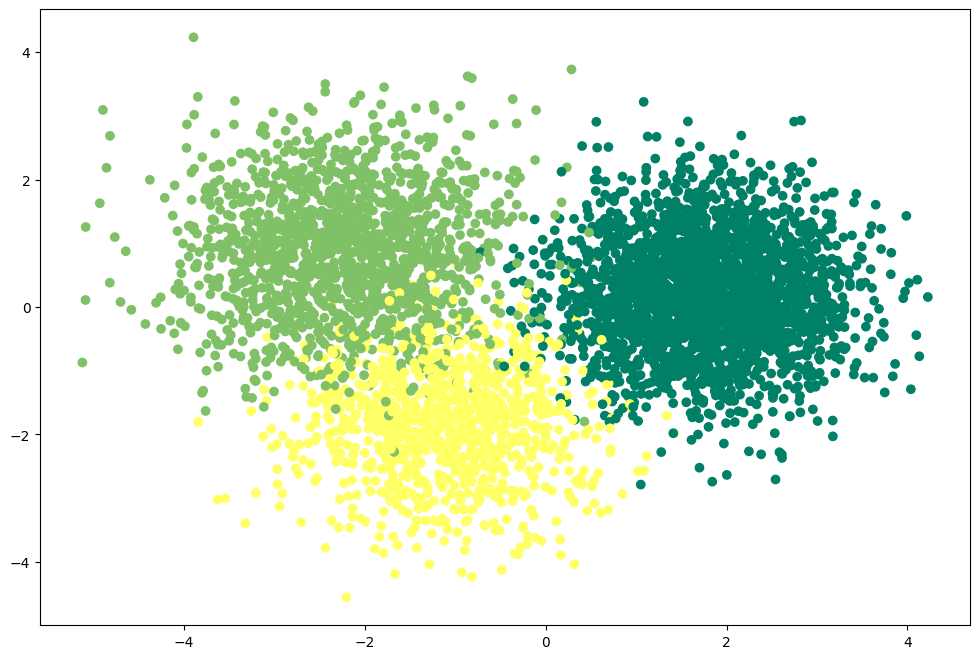

In [41]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=final_df['principal component 1'],y=final_df['principal component 2'],c=final_df['target'],cmap='summer')
plt.show()

## t-SNE

In [42]:
tsne = TSNE(n_components=3,random_state=42)

In [43]:
X_tsne = tsne.fit_transform(X_values)

In [44]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [45]:
tsne_data

,dim_1,dim_2,dim_3,target
0,-23.494797,-2.008594,-4.969852,1
1,40.071922,-2.162862,23.373766,0
2,-16.546524,20.949686,-4.761196,2
3,-44.869720,-13.146941,9.394529,1
4,24.912802,23.209320,27.061148,0
...,...,...,...,...
4995,-22.210587,-30.026199,15.786878,1
4996,-11.004691,-4.650721,3.746724,2
4997,7.141504,25.617657,-5.288829,0
4998,3.666359,-9.309947,25.957178,0


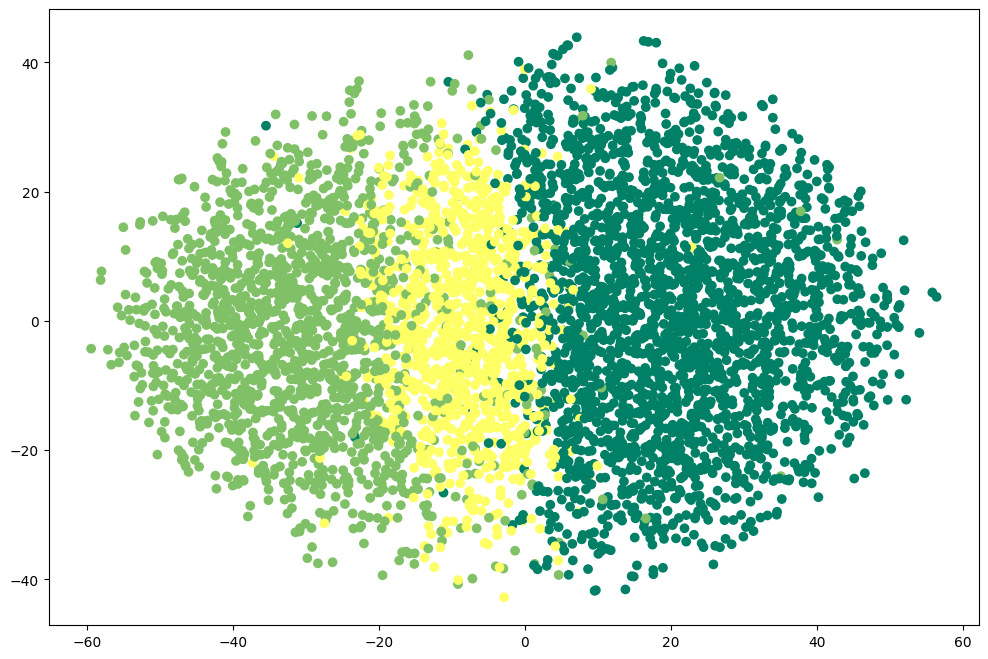

In [46]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'],cmap='summer')
plt.show()

In [47]:
tsne.kl_divergence_

3.025303363800049

## umap

In [48]:
umap = umap.UMAP(n_components=3,random_state=42)

In [49]:
X_umap = umap.fit_transform(X_values)

In [50]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [51]:
umap_data

,dim_1,dim_2,dim_3,target
0,2.254182,6.497614,4.057344,1
1,8.502939,5.861910,2.998354,0
2,2.732425,4.764342,4.700423,2
3,1.102358,7.195624,3.541008,1
4,7.644289,5.711672,1.950739,0
...,...,...,...,...
4995,2.678213,5.944257,3.624900,1
4996,3.553589,5.477468,3.888391,2
4997,7.520193,7.181085,3.483528,0
4998,7.138495,4.895601,2.481851,0


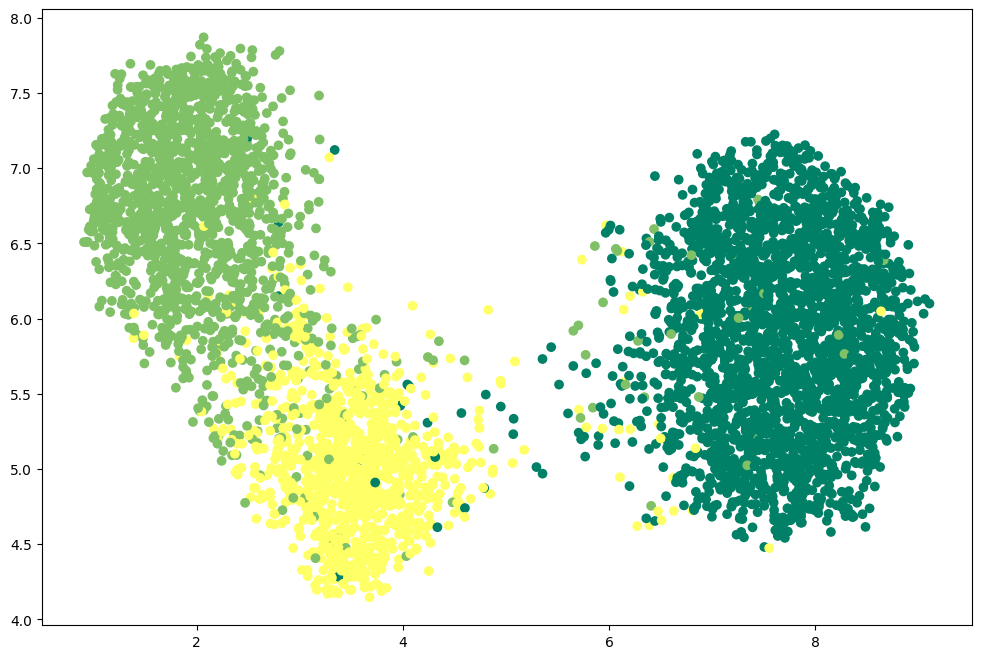

In [52]:
fig = plt.figure(figsize=(12,8))
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'],cmap='summer')
plt.show()

## k-means 

In [53]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [54]:
kmeans.fit(X_values)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [55]:
df_kmeans = corr_dataset.copy()

In [56]:
df_kmeans['k_means'] = kmeans.labels_

In [57]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,k_means
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,1
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,1
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1


In [58]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.0136
accuracy after: 0.9594


In [59]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,k_means
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


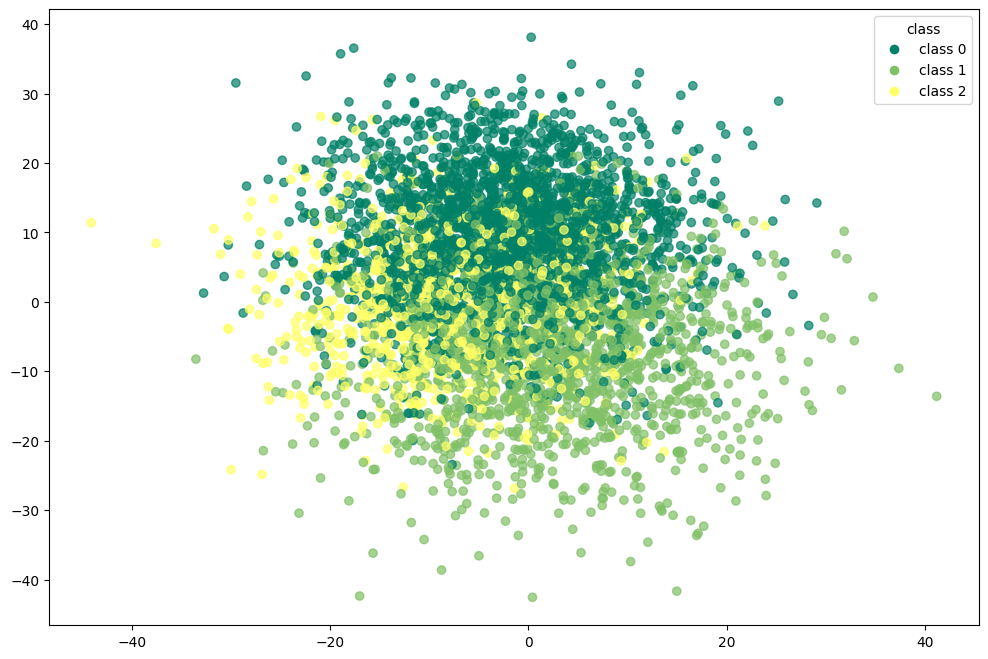

In [60]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

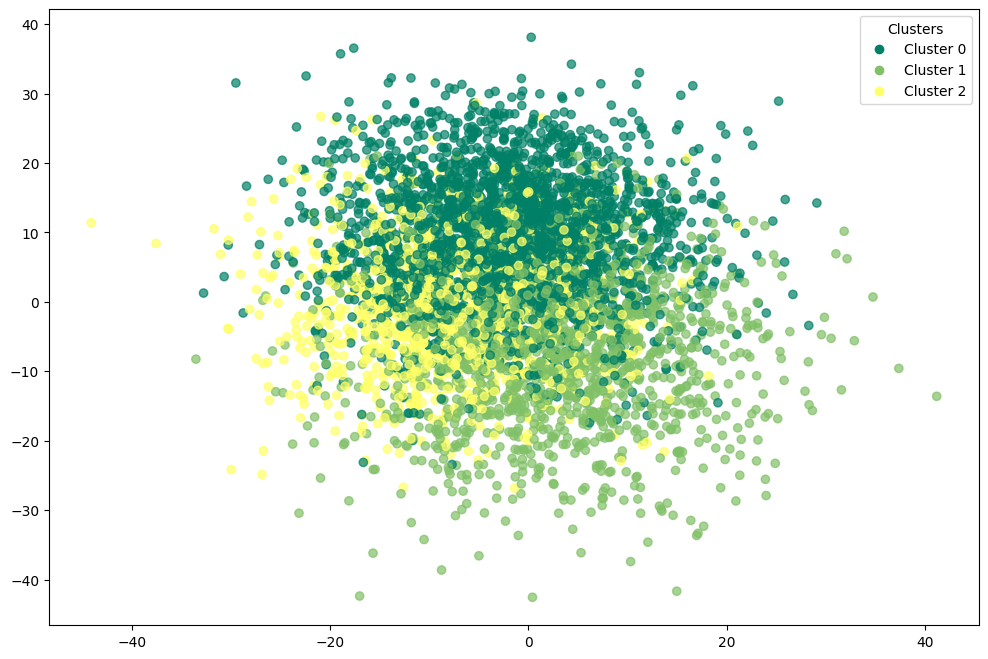

In [61]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [62]:
kmeans.cluster_centers_

array([[-0.58869546, -0.23414583, -0.74311586,  0.60735865, -0.01574417,
         0.38627029,  0.3746233 , -0.34746336, -0.11171058, -0.40519923,
         0.90150439,  0.13624477,  0.43882136,  0.54441662,  0.18690813,
         0.66069843, -0.42788597, -0.30901697, -0.67277643, -0.0588496 ],
       [-0.01550571,  0.5690415 ,  0.49742245,  0.01413053, -0.24561172,
        -0.50111855, -0.22621338,  0.36535836,  0.04656666,  0.54693741,
        -0.58687309,  0.45865824,  0.35556375, -0.5967969 , -0.55759055,
        -0.57444474,  0.10125949,  0.40988302,  0.01197585, -0.1242675 ],
       [ 0.49784322, -0.82755852, -0.29334548, -0.51029784,  0.45048876,
         0.58495179,  0.10411183, -0.3738935 ,  0.00619835, -0.65152584,
         0.32632503, -0.92658545, -0.98444411,  0.62922847,  0.84487128,
         0.49650016,  0.16121632, -0.48398632,  0.51600131,  0.2685667 ]])

In [63]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[2462    6   32]
 [  15 1369  116]
 [  13   21  966]]


In [64]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2500
           1       0.98      0.91      0.95      1500
           2       0.87      0.97      0.91      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [65]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.904534809358734

In [66]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.83462932889749

In [67]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.13887515732704114

### k-means with pca

In [68]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [69]:
kmeans_pca.fit(X_pca)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [70]:
df_pca_kmeans = corr_dataset.copy()

In [71]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [72]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [73]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.9574
accuracy after: 0.9574


In [74]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [75]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2456    7   37]
 [  14 1365  121]
 [  13   21  966]]


In [76]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2500
           1       0.98      0.91      0.94      1500
           2       0.86      0.97      0.91      1000

    accuracy                           0.96      5000
   macro avg       0.94      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



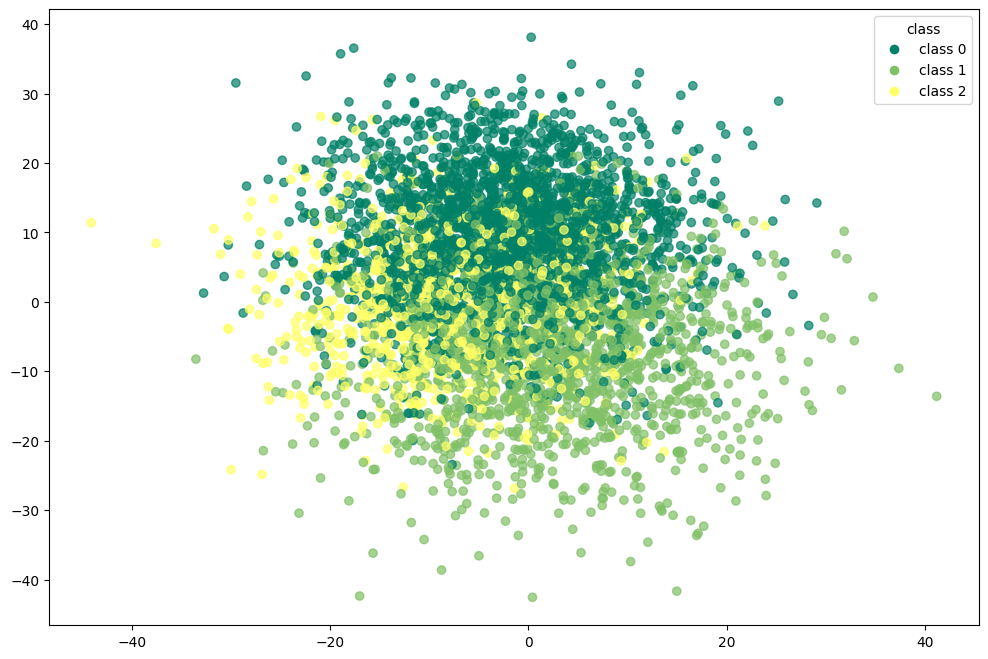

In [77]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

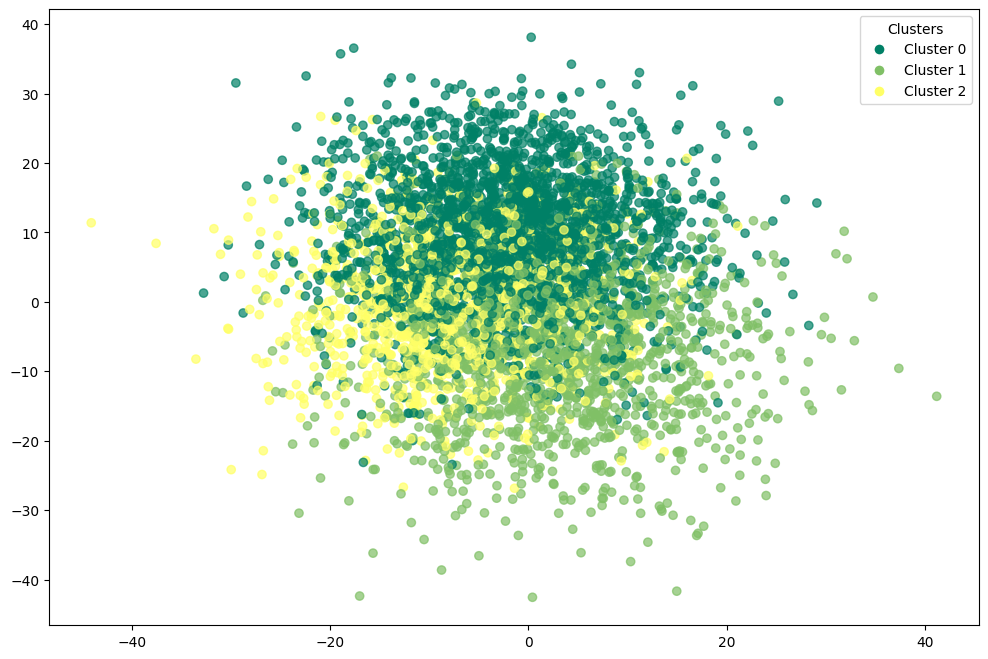

In [78]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [79]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8996356668259986

In [80]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8285749535251337

In [81]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.13888839005219555

### k-means with t-SNE

In [82]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [83]:
kmeans_tsne.fit(X_tsne)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [84]:
df_tsne_kmeans = corr_dataset.copy()

In [85]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [86]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,1
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,1
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1


In [87]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.3978
accuracy after: 0.5968


In [88]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,2
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,2


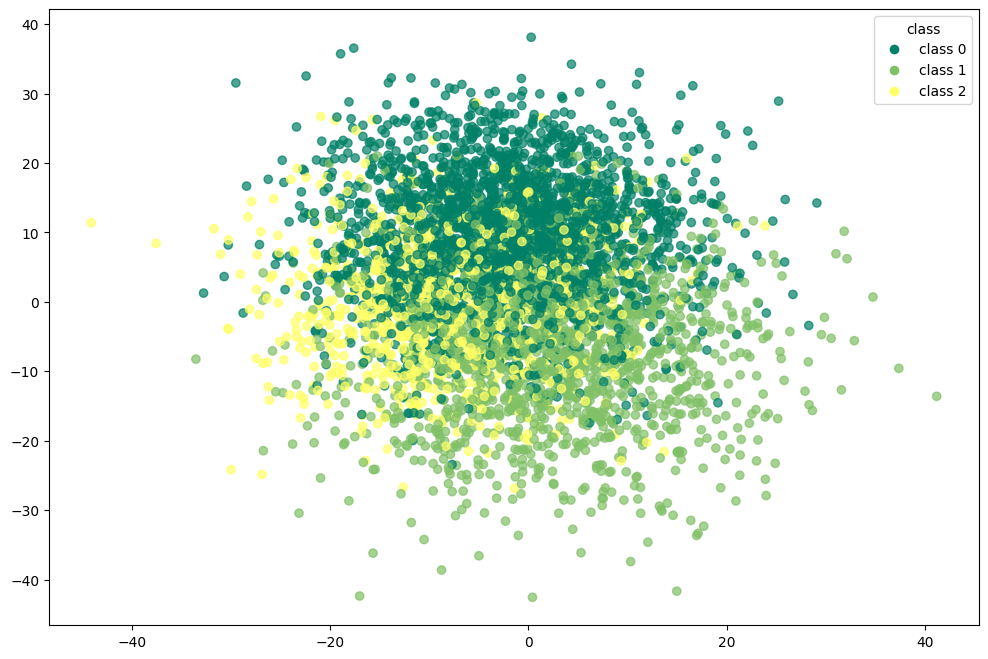

In [89]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

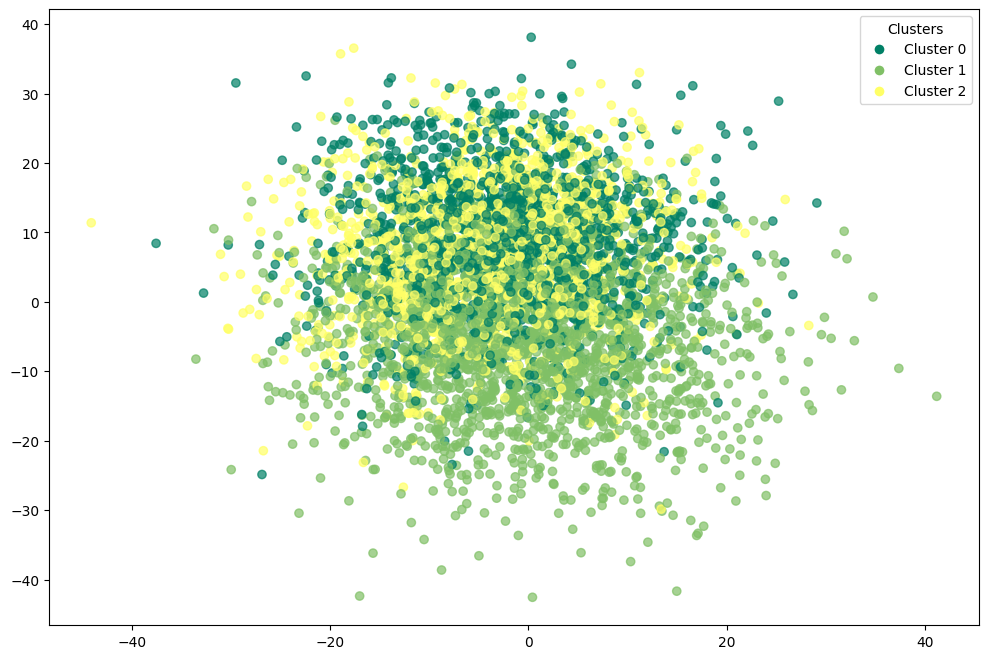

In [90]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [91]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1330    6 1164]
 [  30 1419   51]
 [ 157  608  235]]


In [92]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.88      0.53      0.66      2500
           1       0.70      0.95      0.80      1500
           2       0.16      0.23      0.19      1000

    accuracy                           0.60      5000
   macro avg       0.58      0.57      0.55      5000
weighted avg       0.68      0.60      0.61      5000



In [93]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.4061366530052209

In [94]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.4472303666973542

In [95]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.04901108704924967

### k-means with umap

In [96]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [97]:
kmeans_umap.fit(X_umap)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [98]:
df_umap_kmeans = corr_dataset.copy()

In [99]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [100]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [101]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.5278
accuracy after: 0.9522


In [102]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,kmeans_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


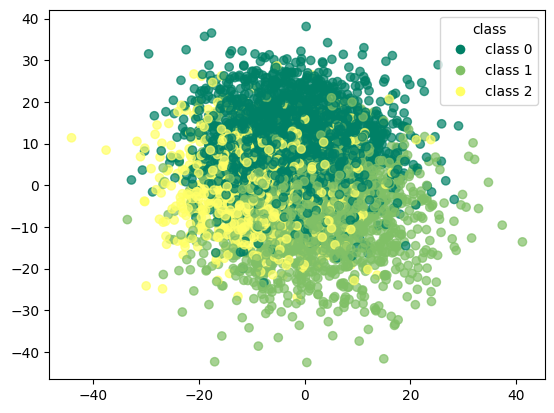

In [103]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

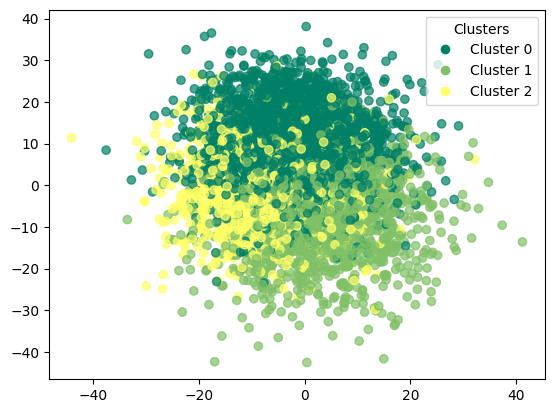

In [104]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [105]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[2478    4   18]
 [  29 1343  128]
 [  27   33  940]]


In [106]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.93      1500
           2       0.87      0.94      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.95      0.95      0.95      5000



In [107]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.8887083628147412

In [108]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.8101379566976469

In [109]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.1384609193631541

## trimmed k-means

In [110]:
trimmed_kmeans,trimmmed_indices,_ = trimmed_clustering(X_values,n_clusters=N_CLUSTER,trim_fraction=0.1)

In [111]:
trimmed_kmeans

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [112]:
df_trim_kmeans = corr_dataset.copy()

In [113]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indices]  

In [114]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [115]:
df_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [116]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.5475555555555556
accuracy after: 0.9651111111111111


In [117]:
df_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


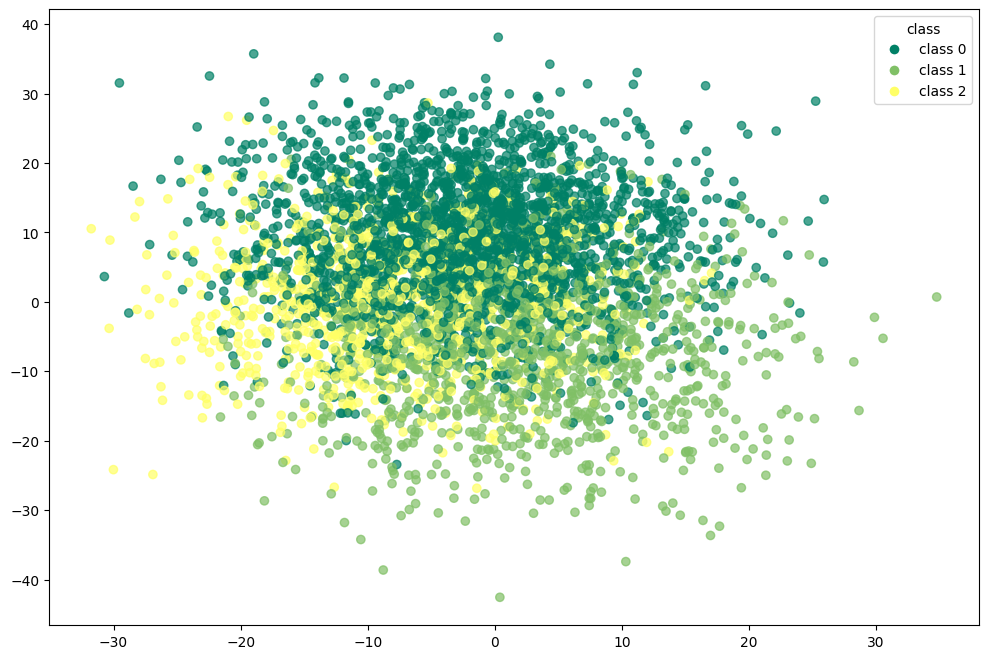

In [118]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

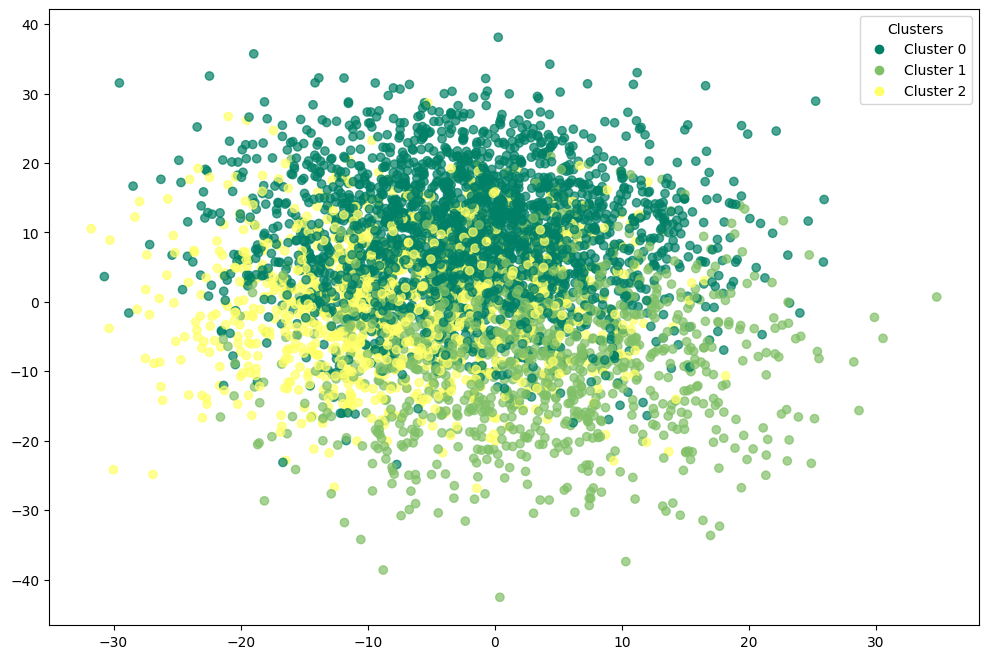

In [119]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [120]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[2362    6   30]
 [   8 1056   80]
 [  11   22  925]]


In [121]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2398
           1       0.97      0.92      0.95      1144
           2       0.89      0.97      0.93       958

    accuracy                           0.97      4500
   macro avg       0.95      0.96      0.95      4500
weighted avg       0.97      0.97      0.97      4500



In [122]:
adjusted_rand_score(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans'])

0.9195344582160112

In [123]:
normalized_mutual_info_score(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans'])

0.8481146611113904

In [124]:
silhouette_score(df_trim_kmeans.drop(columns=['target','trim_kmeans']).values,df_trim_kmeans['trim_kmeans'])

0.14882998867802172

### trimmed k-means with pca

In [125]:
trim_kmeans_pca,trimmmed_indices,_ = trimmed_clustering(X_pca,n_clusters=N_CLUSTER,trim_fraction=0.1)

In [126]:
trim_kmeans_pca

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [127]:
df_pca_trim_kmeans = corr_dataset.copy()

In [128]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indices]  

In [129]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [130]:
df_pca_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
5,-8.705546,-4.985660,-7.585501,-22.433533,13.054180,14.402036,14.288182,10.876739,11.330115,0.691029,...,-24.001558,12.617621,15.796299,1.091463,-26.278736,-6.936122,17.359782,-7.846524,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [131]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.5817777777777777
accuracy after: 0.5817777777777777


In [132]:
df_pca_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
5,-8.705546,-4.985660,-7.585501,-22.433533,13.054180,14.402036,14.288182,10.876739,11.330115,0.691029,...,-24.001558,12.617621,15.796299,1.091463,-26.278736,-6.936122,17.359782,-7.846524,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [133]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1227   15 1238]
 [   6 1320    9]
 [  11  603   71]]


In [134]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66      2480
           1       0.68      0.99      0.81      1335
           2       0.05      0.10      0.07       685

    accuracy                           0.58      4500
   macro avg       0.57      0.53      0.51      4500
weighted avg       0.75      0.58      0.61      4500



In [135]:
adjusted_rand_score(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca'])

0.46408408143144664

In [136]:
normalized_mutual_info_score(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca'])

0.5789640432296226

In [137]:
silhouette_score(df_pca_trim_kmeans.drop(columns=['target','trim_kmeans_pca']).values,df_pca_trim_kmeans['trim_kmeans_pca'])

0.06826514205440276

### trimmed k-means with t-SNE

In [138]:
trim_kmeans_tsne,trimmmed_indices,_ = trimmed_clustering(X_tsne,n_clusters=N_CLUSTER,trim_fraction=0.1)

In [139]:
trim_kmeans_tsne

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [140]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [141]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indices]  

In [142]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [143]:
df_tsne_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,2
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,2


In [144]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.5775555555555556
accuracy after: 0.5795555555555556


In [145]:
df_tsne_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


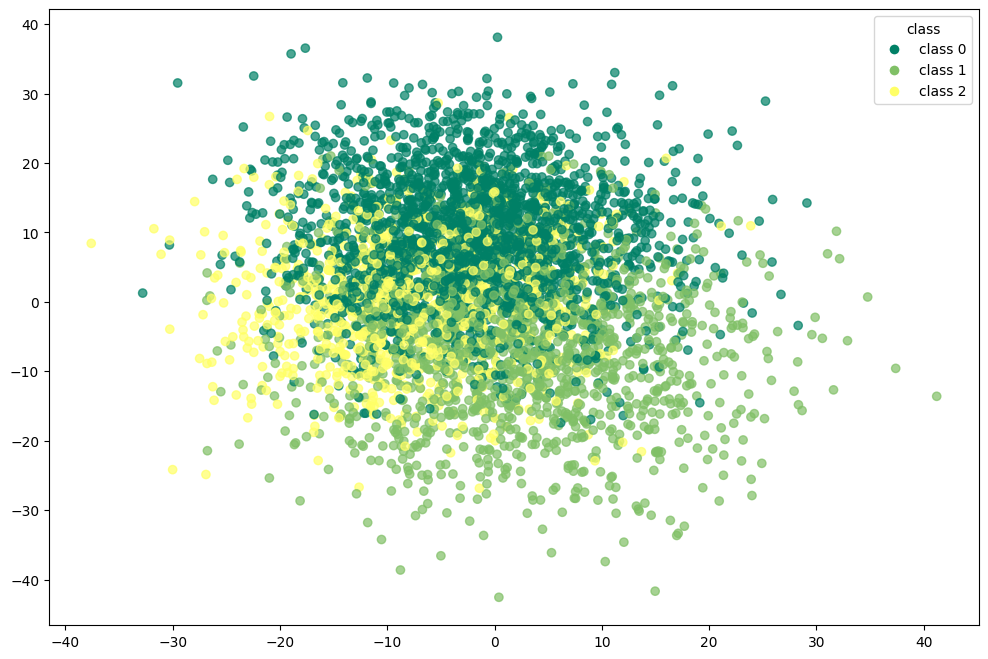

In [146]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

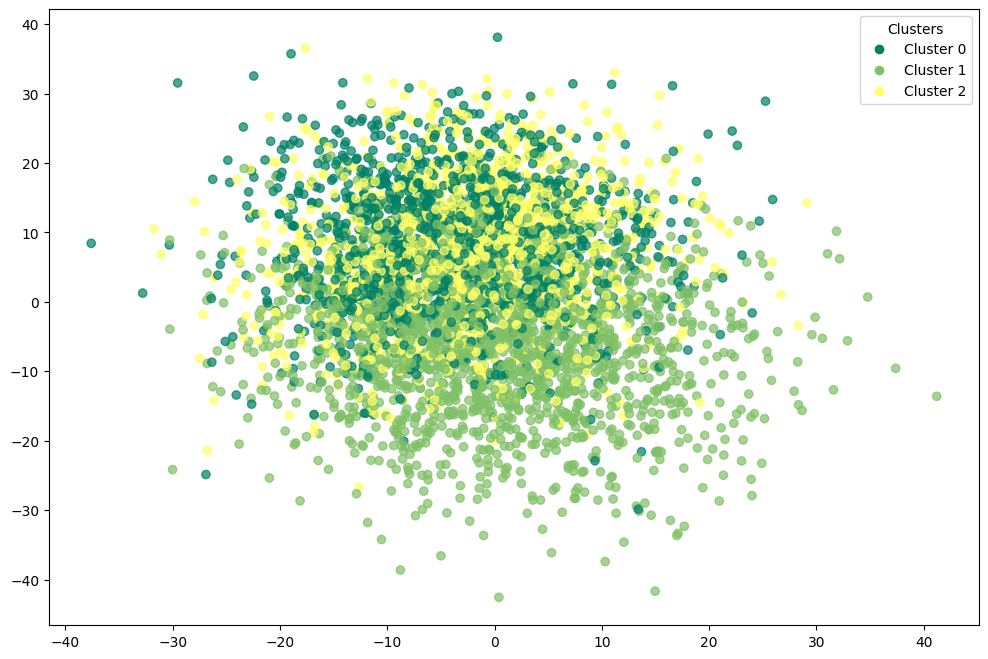

In [147]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [148]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1117    5 1110]
 [  25 1294   25]
 [ 195  532  197]]


In [149]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.84      0.50      0.63      2232
           1       0.71      0.96      0.82      1344
           2       0.15      0.21      0.17       924

    accuracy                           0.58      4500
   macro avg       0.56      0.56      0.54      4500
weighted avg       0.66      0.58      0.59      4500



In [150]:
adjusted_rand_score(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])

0.4080118853365498

In [151]:
normalized_mutual_info_score(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])

0.4530694668736187

In [152]:
silhouette_score(df_tsne_trim_kmeans.drop(columns=['target','trim_kmeans_tsne']).values,df_tsne_trim_kmeans['trim_kmeans_tsne'])

0.05352413031755421

### trimmed k-means with umap

In [153]:
trim_kmeans_umap,trimmmed_indices,_ = trimmed_clustering(X_umap,n_clusters=N_CLUSTER,trim_fraction=0.1)

In [154]:
trim_kmeans_umap

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [155]:
df_umap_trim_kmeans = corr_dataset.copy()

In [156]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [157]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [158]:
df_umap_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [159]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.9444444444444444
accuracy after: 0.9444444444444444


In [160]:
df_umap_trim_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,trim_kmeans_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


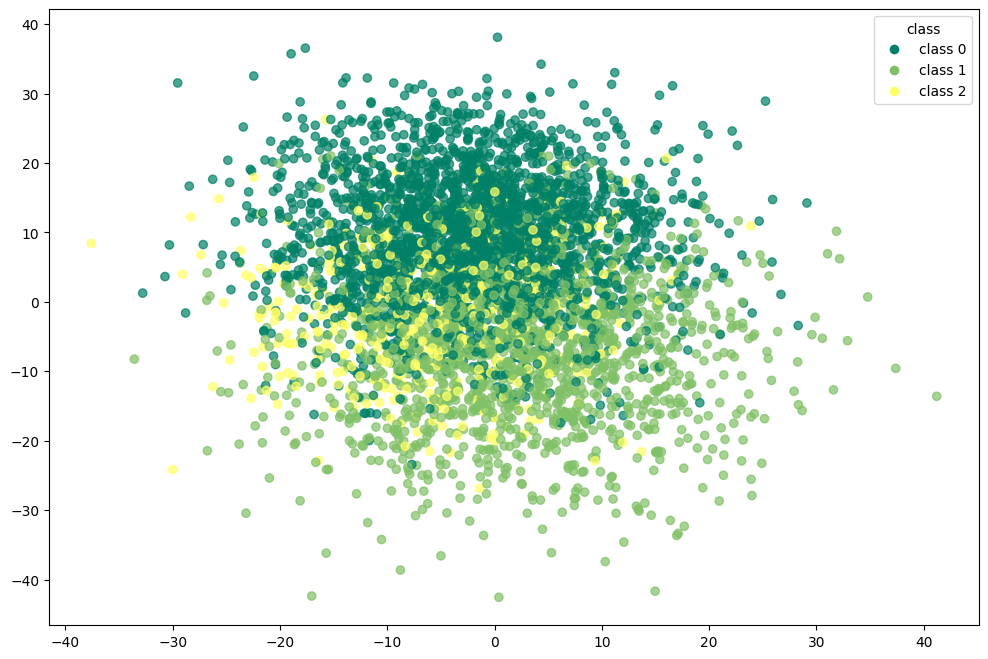

In [161]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

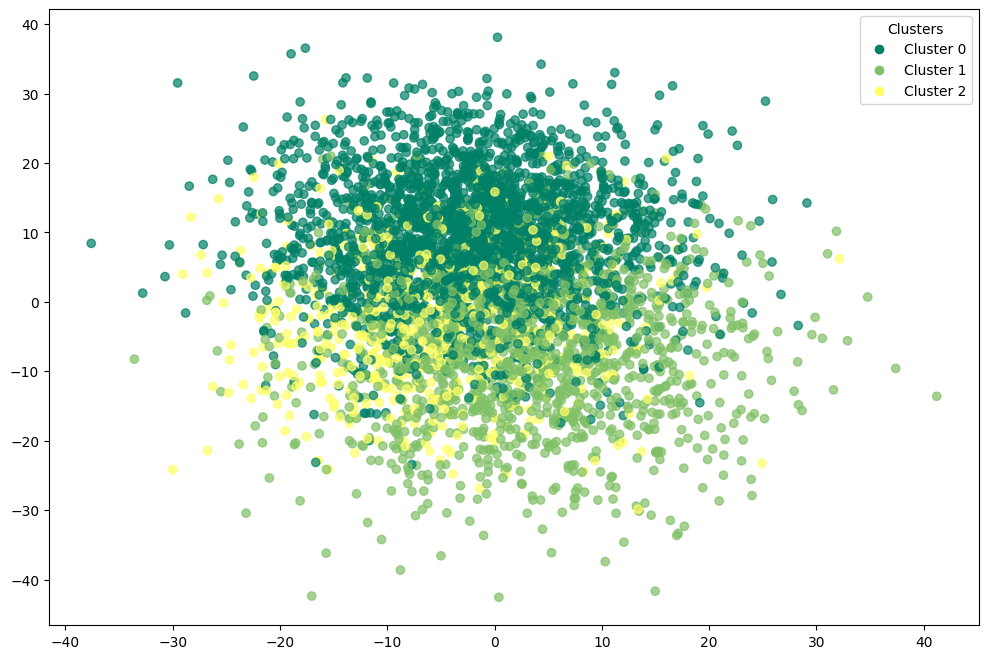

In [162]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [163]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[2478    4    3]
 [  29 1283  171]
 [  27   16  489]]


In [164]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2485
           1       0.98      0.87      0.92      1483
           2       0.74      0.92      0.82       532

    accuracy                           0.94      4500
   macro avg       0.90      0.93      0.91      4500
weighted avg       0.95      0.94      0.95      4500



In [165]:
adjusted_rand_score(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])

0.8885799748044516

In [166]:
normalized_mutual_info_score(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])

0.8001993141201509

In [167]:
silhouette_score(df_umap_trim_kmeans.drop(columns=['target','trim_kmeans_umap']).values,df_umap_trim_kmeans['trim_kmeans_umap'])

0.13881764391657167

## GMM - Gaussian Mixture Models

In [168]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [169]:
gmm.fit(X_values)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [170]:
df_gmm = corr_dataset.copy()

In [171]:
df_gmm['gmm'] = gmm.predict(X_values)

In [172]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,1
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,0
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,1
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1


In [173]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.0416
accuracy after: 0.7666


In [174]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


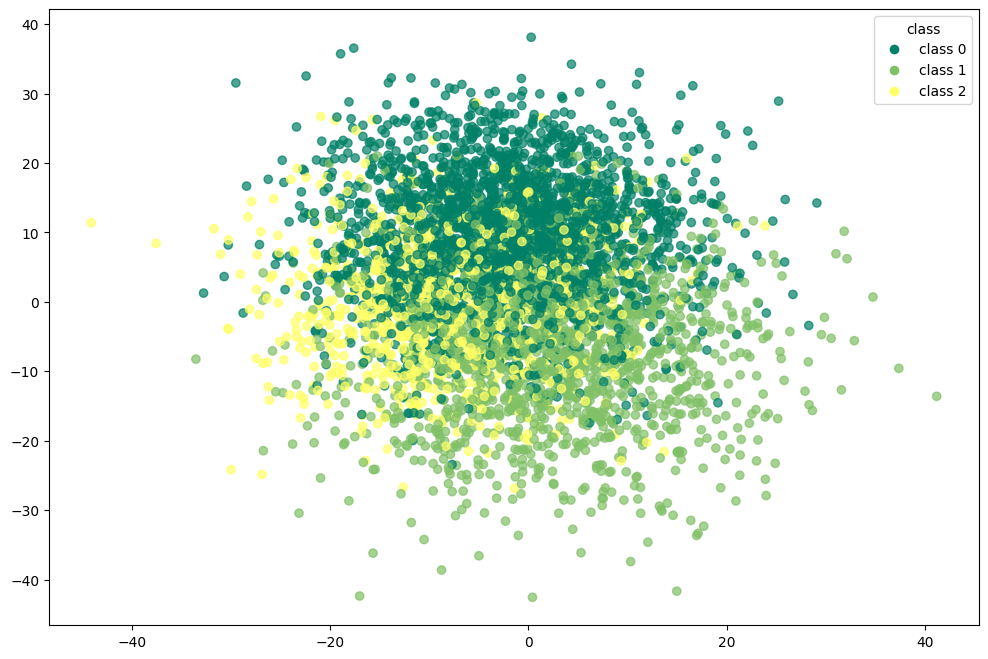

In [175]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

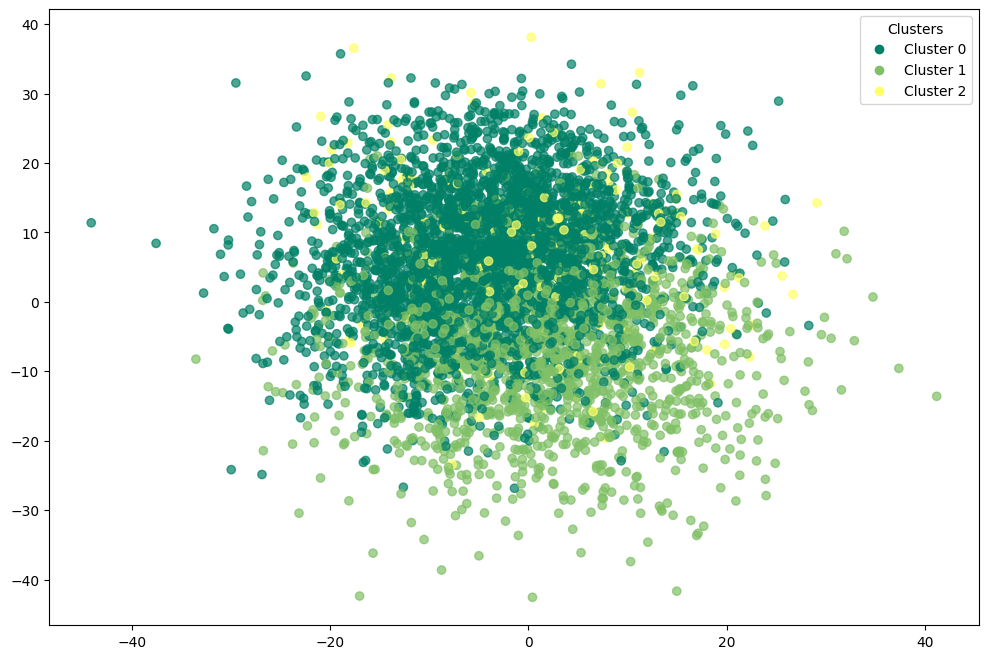

In [176]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [177]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[2399    1  100]
 [  40 1391   69]
 [ 889   68   43]]


In [178]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.72      0.96      0.82      2500
           1       0.95      0.93      0.94      1500
           2       0.20      0.04      0.07      1000

    accuracy                           0.77      5000
   macro avg       0.63      0.64      0.61      5000
weighted avg       0.69      0.77      0.71      5000



In [179]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.5467869698132275

In [180]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.5592484282922163

In [181]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.09737465375088329

### GMM with pca

In [182]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [183]:
gmm_pca.fit(X_pca)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [184]:
df_pca_gmm = corr_dataset.copy()

In [185]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [186]:
df_pca_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [187]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.9654
accuracy after: 0.9654


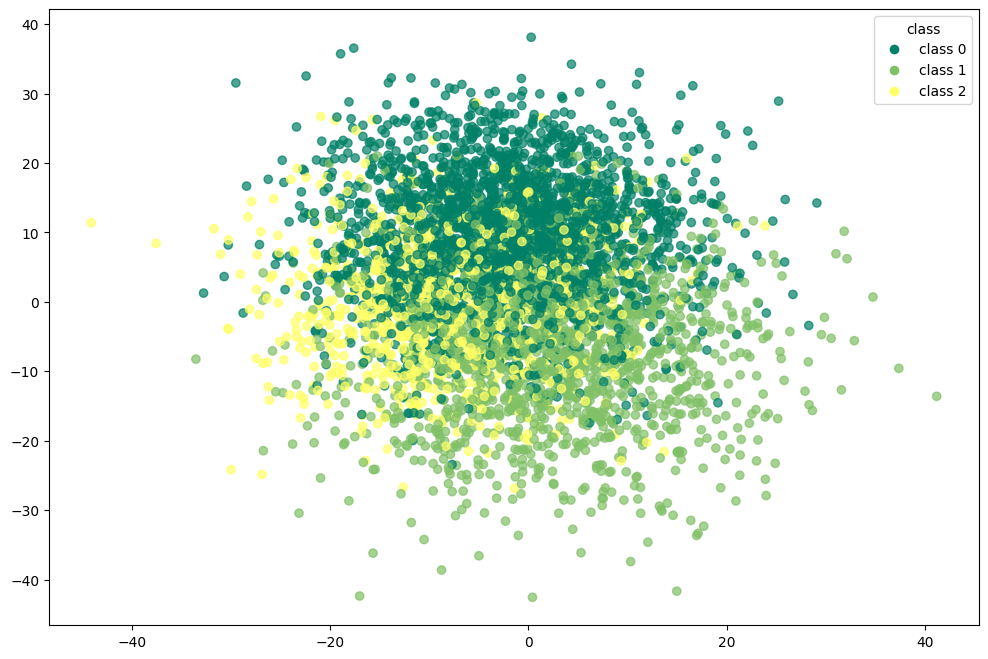

In [188]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

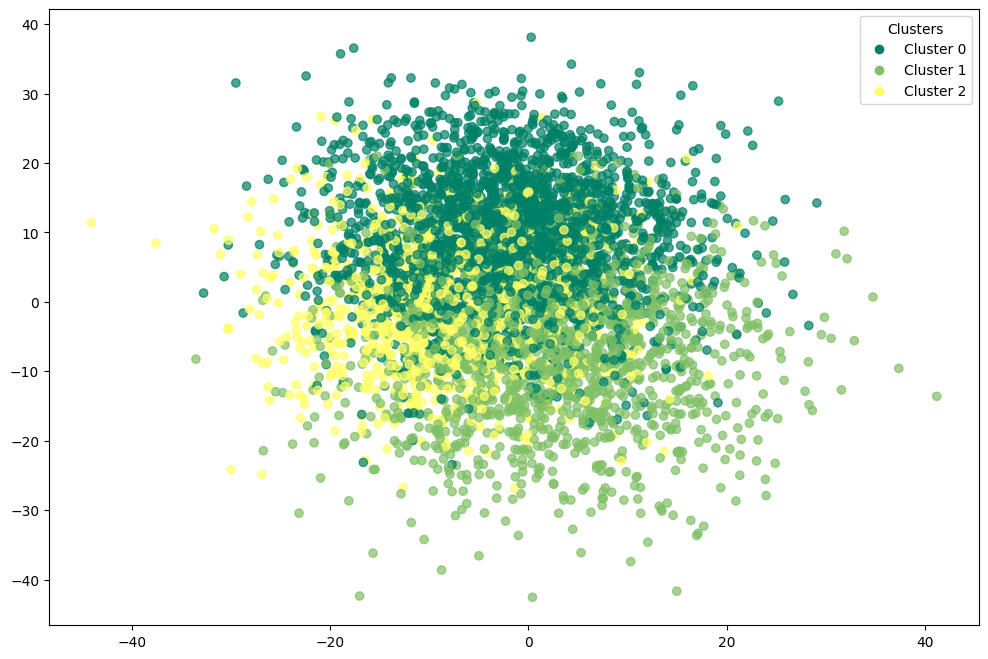

In [189]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [190]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2464    6   30]
 [  15 1412   73]
 [  13   36  951]]


In [191]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2500
           1       0.97      0.94      0.96      1500
           2       0.90      0.95      0.93      1000

    accuracy                           0.97      5000
   macro avg       0.95      0.96      0.96      5000
weighted avg       0.97      0.97      0.97      5000



In [192]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.9166448010143234

In [193]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.8465709682698755

In [194]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.13580601005032586

### GMM with t-SNE

In [195]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [196]:
gmm_tsne.fit(X_tsne)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [197]:
df_tsne_gmm = corr_dataset.copy()

In [198]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [199]:
df_tsne_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,1
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,1
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1


In [200]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.3206
accuracy after: 0.5802


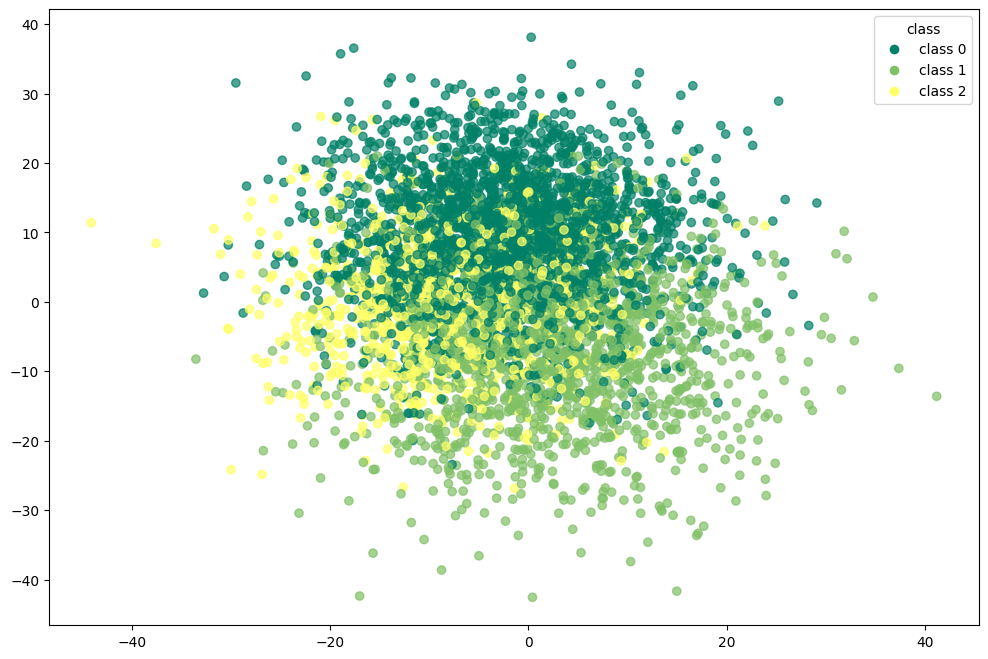

In [201]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

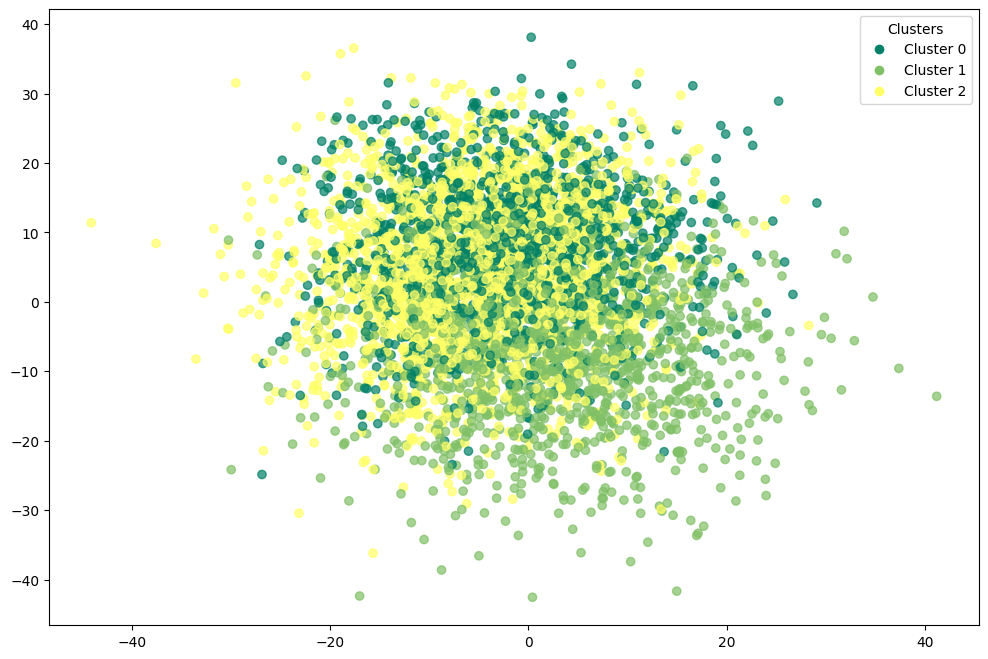

In [202]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [203]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1131    2 1367]
 [  40 1191  269]
 [ 218  203  579]]


In [204]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.81      0.45      0.58      2500
           1       0.85      0.79      0.82      1500
           2       0.26      0.58      0.36      1000

    accuracy                           0.58      5000
   macro avg       0.64      0.61      0.59      5000
weighted avg       0.72      0.58      0.61      5000



In [205]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.2971678605838113

In [206]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.3373071125650558

In [207]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.031231149002543545

### GMM with umap

In [208]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [209]:
gmm_umap.fit(X_umap)

,n_components,3
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [210]:
df_umap_gmm = corr_dataset.copy()

In [211]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [212]:
df_umap_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,gmm_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [213]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.5264
accuracy after: 0.954


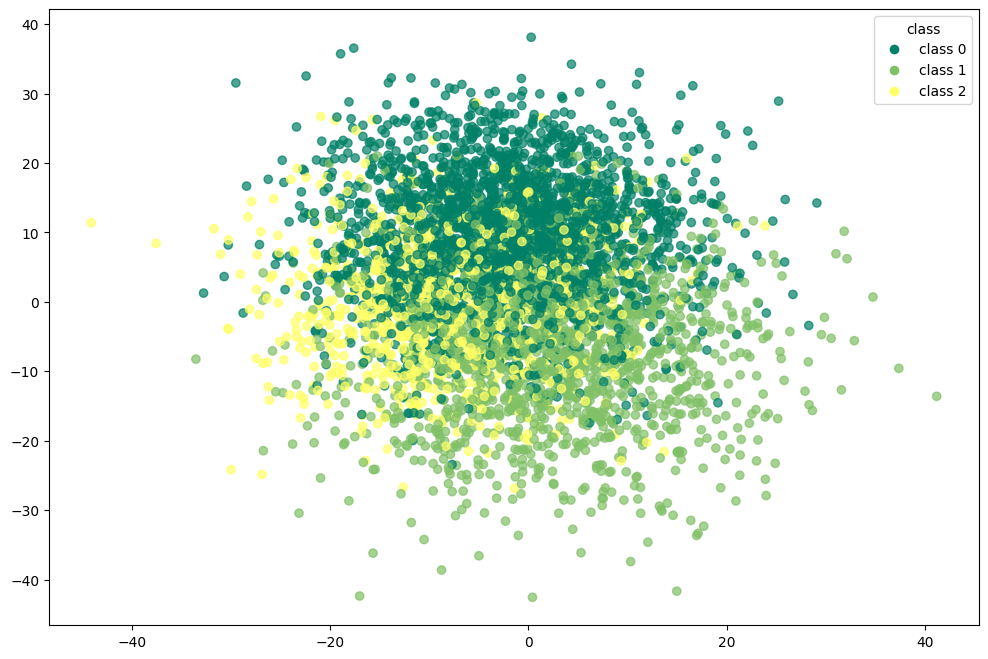

In [214]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

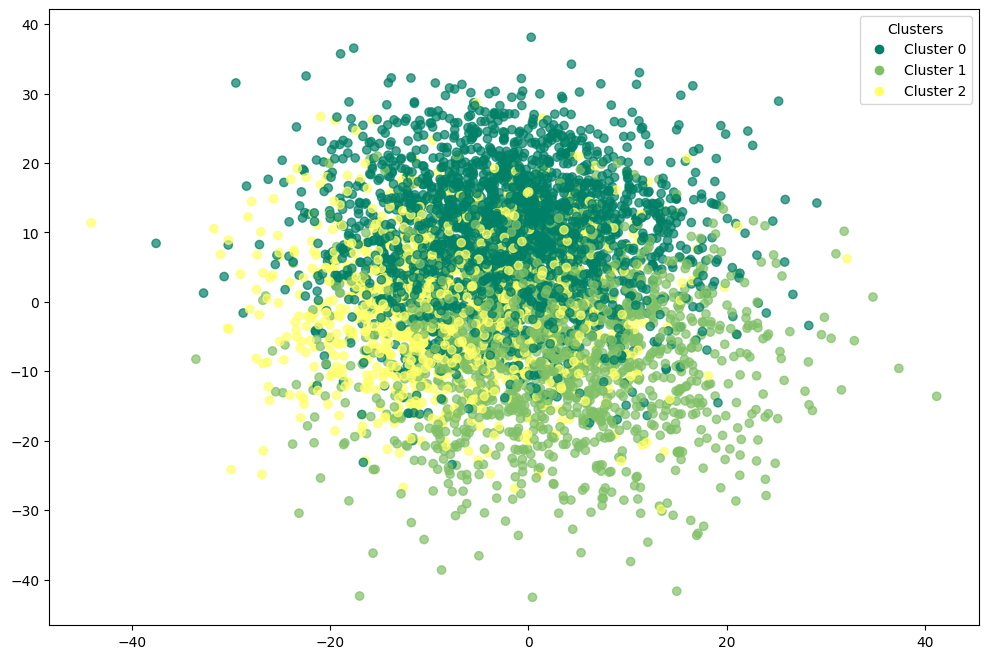

In [215]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [216]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[2479    4   17]
 [  29 1351  120]
 [  27   33  940]]


In [217]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.94      1500
           2       0.87      0.94      0.91      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.96      0.95      0.95      5000



In [218]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.8922265209816971

In [219]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.8144781003949414

In [220]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.13847840120415775

## pam

In [221]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [222]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [223]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [224]:
pam.process()

In [225]:
clusters = pam.get_clusters()

In [226]:
medoids = pam.get_medoids()

In [227]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [228]:
df_pam = corr_dataset.copy()

In [229]:
df_pam['pam'] = labels

In [230]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,0.0
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,2.0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,0.0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,0.0
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,0.0
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,0.0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2.0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1.0


In [231]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.033
accuracy after: 0.6158


In [232]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,2


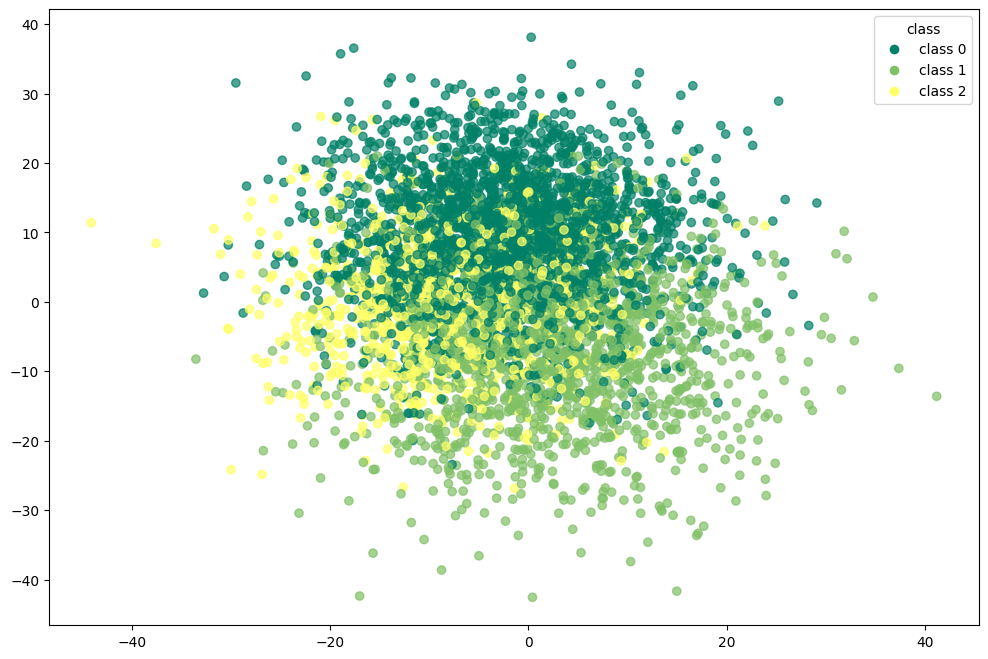

In [233]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

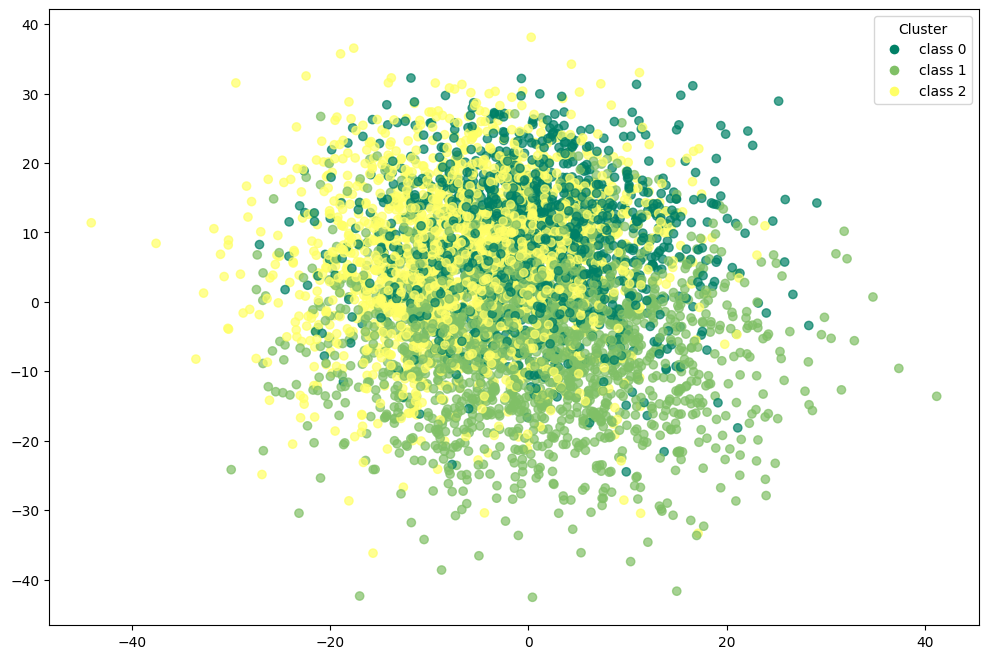

In [234]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [235]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1222   22 1256]
 [  13 1365  122]
 [  21  487  492]]


In [236]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.97      0.49      0.65      2500
           1       0.73      0.91      0.81      1500
           2       0.26      0.49      0.34      1000

    accuracy                           0.62      5000
   macro avg       0.65      0.63      0.60      5000
weighted avg       0.76      0.62      0.64      5000



In [237]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.3745761891782537

In [238]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.4341945993878284

In [239]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.05381445356200885

### pam with pca

In [240]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [241]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [242]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [243]:
pam_pca.process()

In [244]:
clusters = pam_pca.get_clusters()

In [245]:
medoids = pam_pca.get_medoids()

In [246]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [247]:
df_pam_pca = corr_dataset.copy()

In [248]:
df_pam_pca['pam_pca'] = labels

In [249]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1.0
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0.0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2.0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1.0
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1.0
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2.0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0.0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0.0


In [250]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.953
accuracy after: 0.953


In [251]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


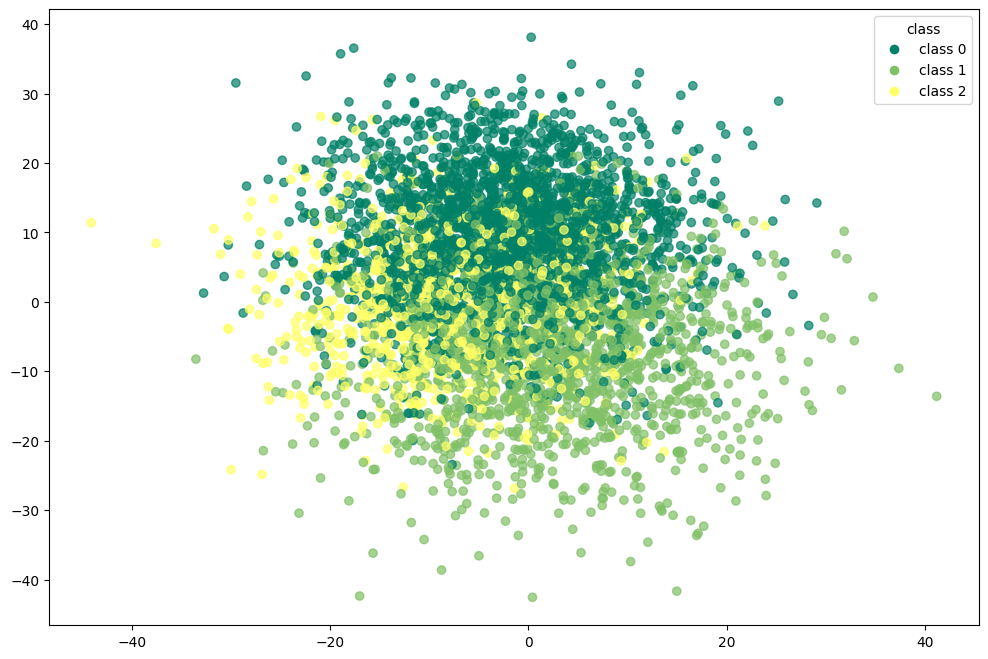

In [252]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

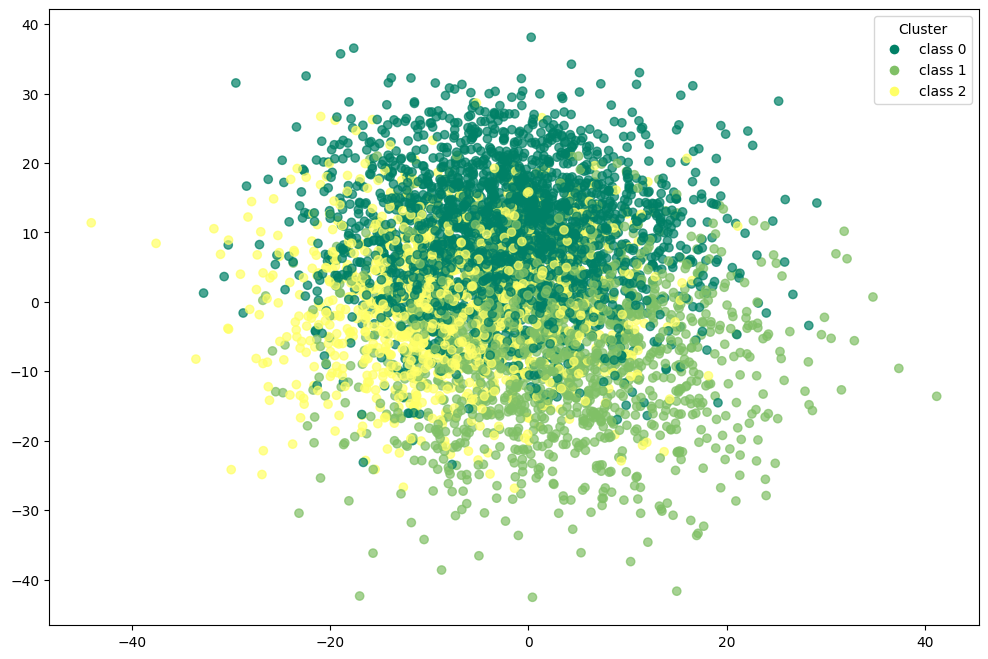

In [253]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [254]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[2450    7   43]
 [  12 1341  147]
 [   8   18  974]]


In [255]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2500
           1       0.98      0.89      0.94      1500
           2       0.84      0.97      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.95      0.94      5000
weighted avg       0.96      0.95      0.95      5000



In [256]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8913556648119421

In [257]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8223338972082489

In [258]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.13874480560176047

### pam with t-SNE

In [259]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [260]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [261]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [262]:
pam_tsne.process()

In [263]:
clusters = pam_tsne.get_clusters()

In [264]:
medoids = pam_tsne.get_medoids()

In [265]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [266]:
df_pam_tsne = corr_dataset.copy()

In [267]:
df_pam_tsne['pam_tsne'] = labels

In [268]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,0.0
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,2.0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,0.0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,0.0
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,0.0
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,0.0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2.0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,2.0


In [269]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.0498
accuracy after: 0.7126


In [270]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


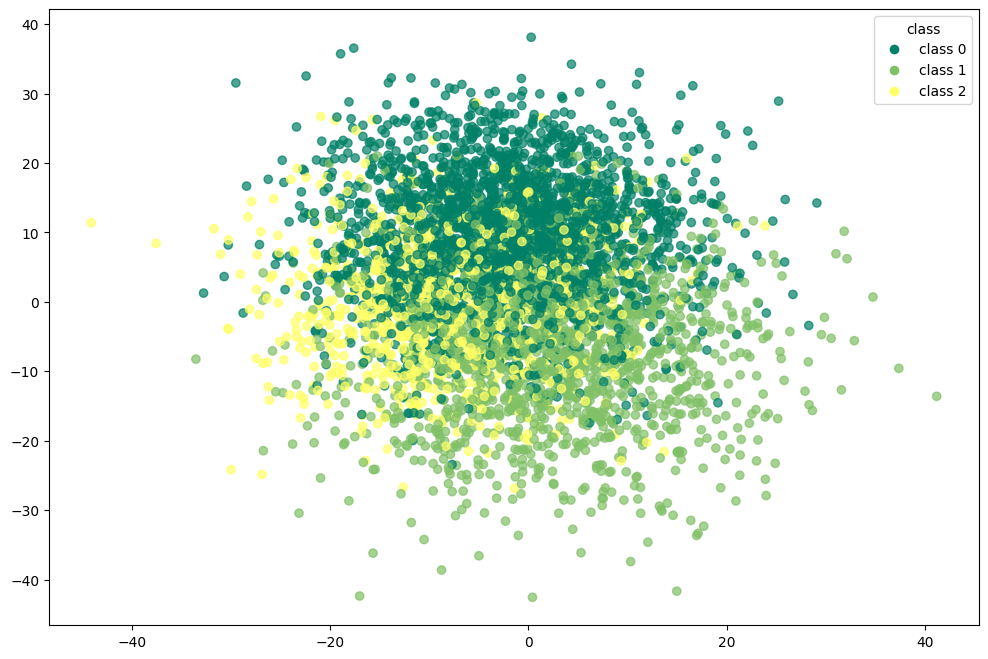

In [271]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

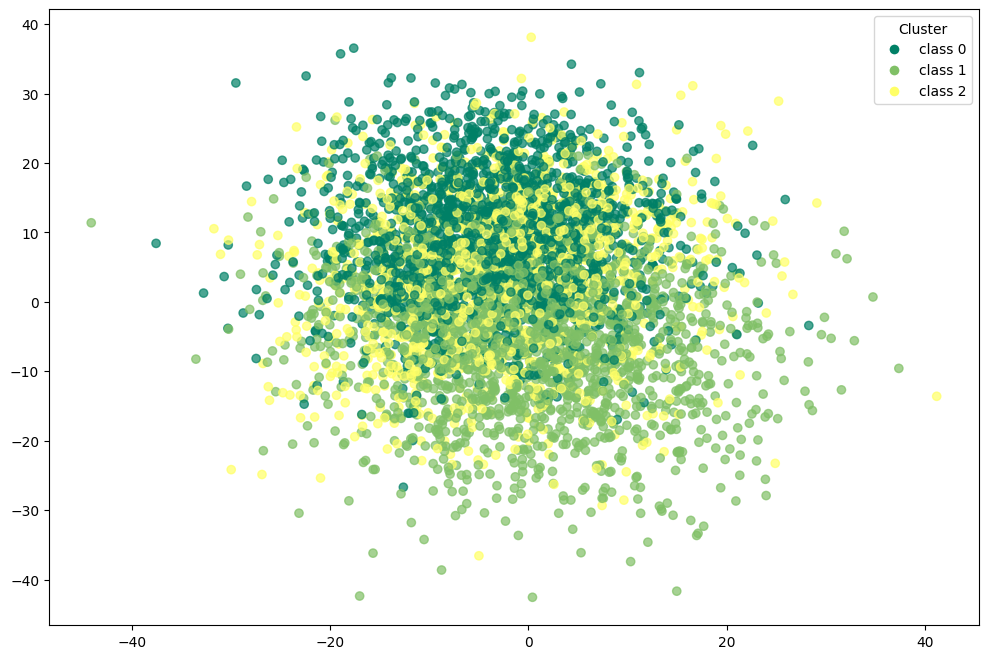

In [272]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [273]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1770   11  719]
 [  20 1322  158]
 [  80  449  471]]


In [274]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.95      0.71      0.81      2500
           1       0.74      0.88      0.81      1500
           2       0.35      0.47      0.40      1000

    accuracy                           0.71      5000
   macro avg       0.68      0.69      0.67      5000
weighted avg       0.77      0.71      0.73      5000



In [275]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.455165975518708

In [276]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.44418064334383456

In [277]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.057716674516610306

### pam with umap

In [278]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [279]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [280]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [281]:
pam_umap.process()

In [282]:
clusters = pam_umap.get_clusters()

In [283]:
medoids = pam_umap.get_medoids()

In [284]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [285]:
df_pam_umap = corr_dataset.copy()

In [286]:
df_pam_umap['pam_umap'] = labels

In [287]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,0.0
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,2.0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1.0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,0.0
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,0.0
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1.0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2.0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,2.0


In [288]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0314
accuracy after: 0.9526


In [289]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,pam_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


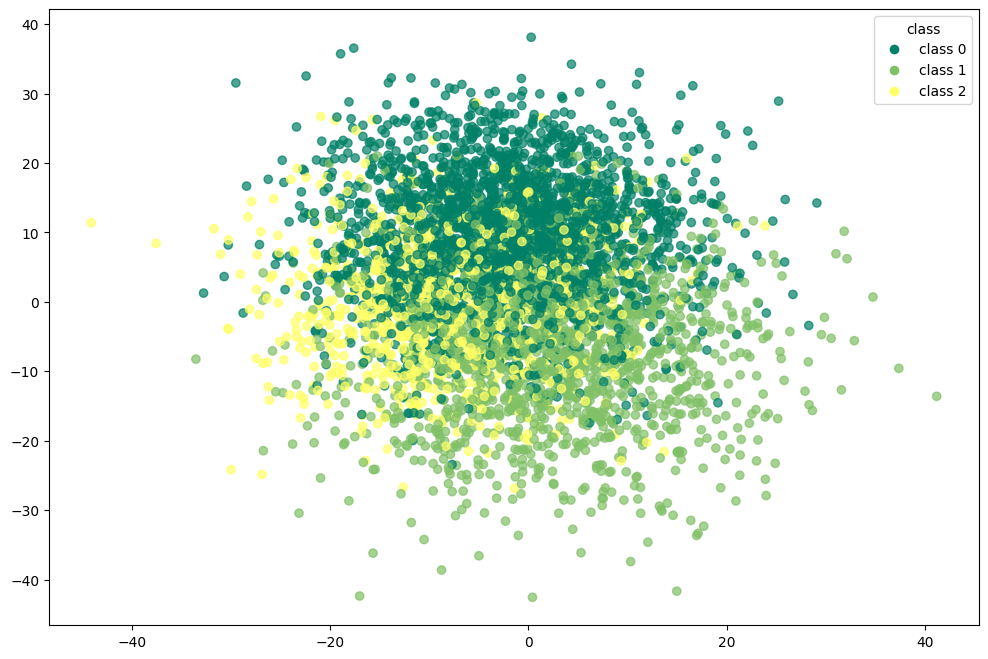

In [290]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

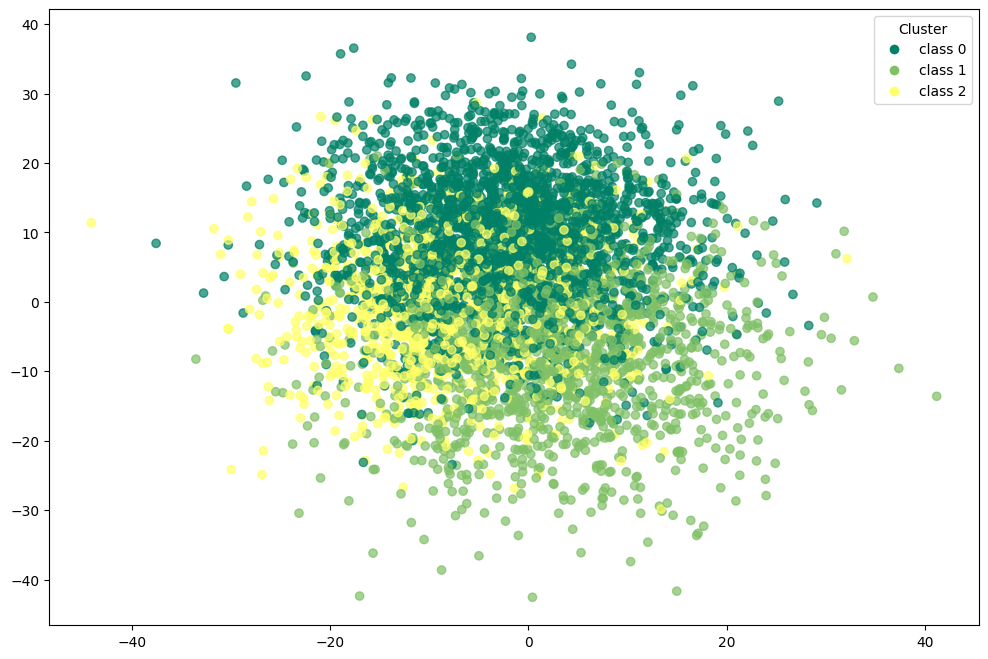

In [291]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [292]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[2478    4   18]
 [  29 1345  126]
 [  27   33  940]]


In [293]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.93      1500
           2       0.87      0.94      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.95      0.95      0.95      5000



In [294]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.889437173089752

In [295]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.8109980284679215

In [296]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.13842649079502092

## spectral clustering

In [297]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [298]:
spectral_clustering.fit(X_values)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [299]:
df_spectral = corr_dataset.copy()

In [300]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [301]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_clustering
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,1
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,1
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1


In [302]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.0172
accuracy after: 0.9568


In [303]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_clustering
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


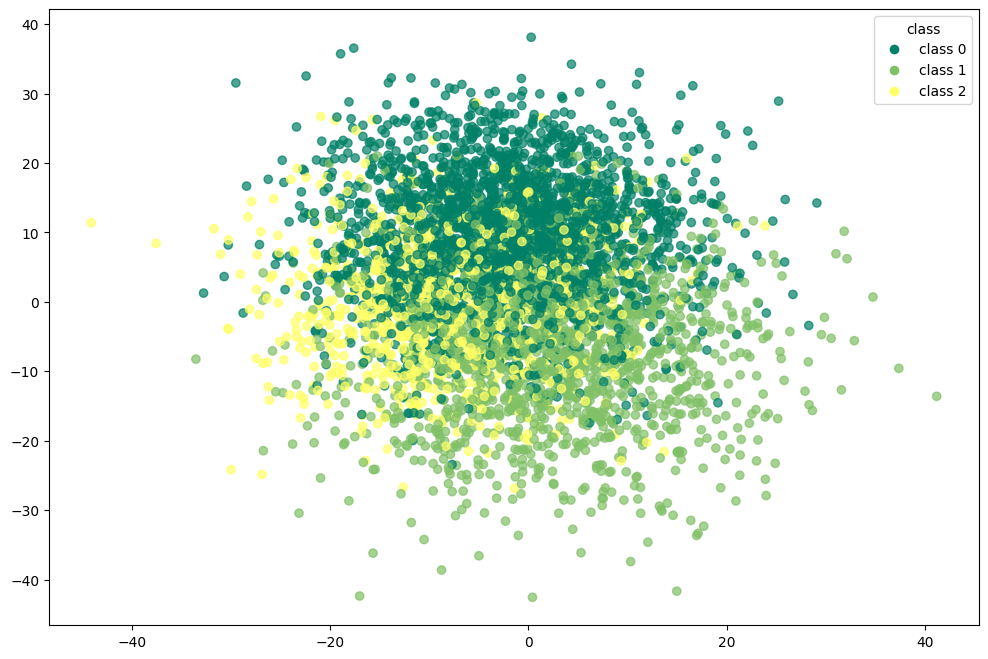

In [304]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

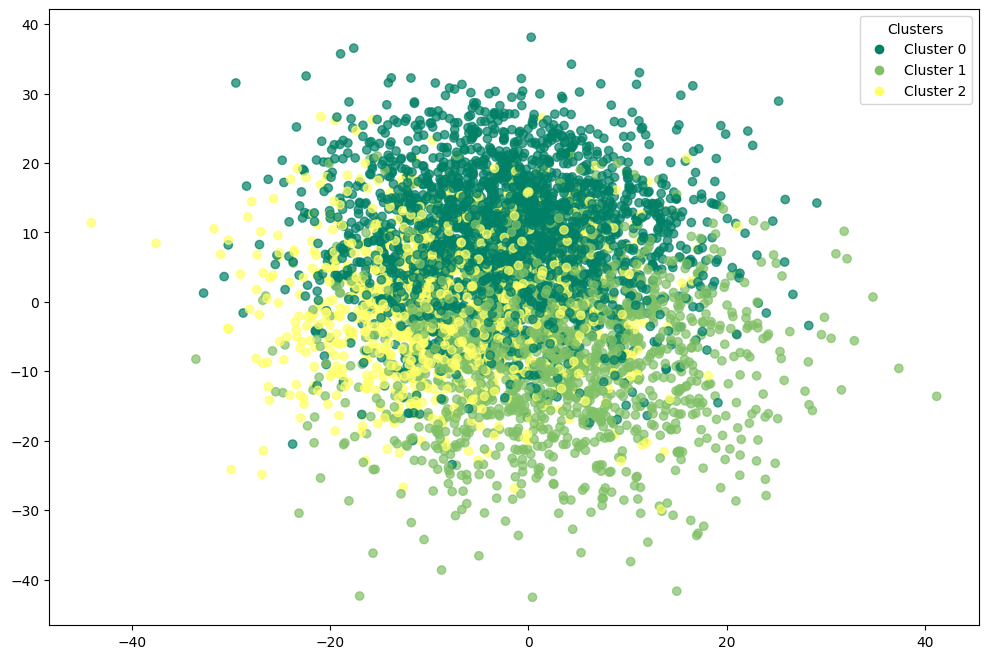

In [305]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [306]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[2479    7   14]
 [  27 1386   87]
 [  36   45  919]]


In [307]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.96      0.92      0.94      1500
           2       0.90      0.92      0.91      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.94      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [308]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.8961853094580409

In [309]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.8162040945451807

In [310]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.139195566276607

### spectral clustering with pca

In [311]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [312]:
spectral_pca.fit(X_pca)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [313]:
df_pca_spectral = corr_dataset.copy()

In [314]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [315]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,1
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,1
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1


In [316]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.0168
accuracy after: 0.96


In [317]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_pca
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [318]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[2455    6   39]
 [  17 1390   93]
 [  17   28  955]]


In [319]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      2500
           1       0.98      0.93      0.95      1500
           2       0.88      0.95      0.92      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [320]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.903087697560662

In [321]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8297665573867139

In [322]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.13760189268171094

### spectral clustering with t-SNE

In [323]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [324]:
spectral_tsne.fit(X_tsne)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [325]:
df_tsne_spectral = corr_dataset.copy()

In [326]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [327]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,0
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,1
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,0
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,0
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,0
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,0
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,1
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,1


In [328]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.0712
accuracy after: 0.591


In [329]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_tsne
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,2
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,2
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,2


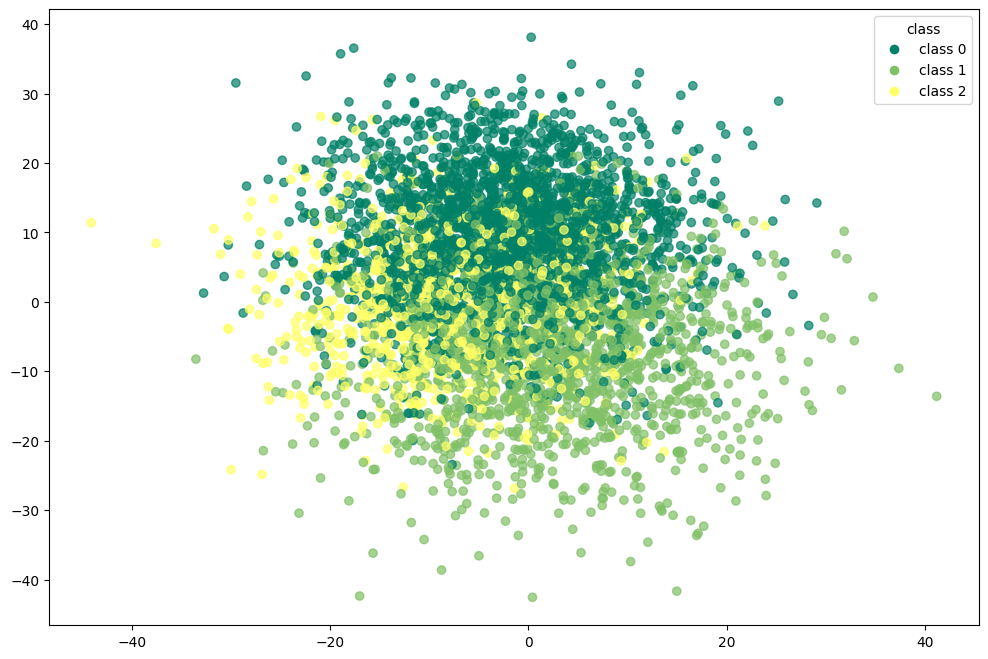

In [330]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

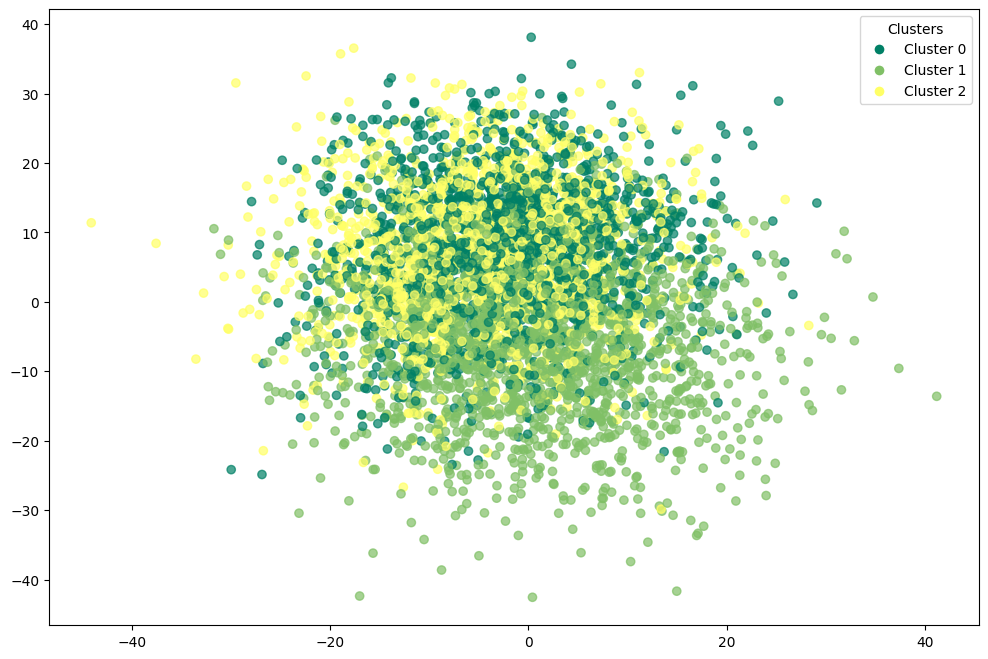

In [331]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [332]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1304    5 1191]
 [  55 1355   90]
 [ 261  443  296]]


In [333]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       0.80      0.52      0.63      2500
           1       0.75      0.90      0.82      1500
           2       0.19      0.30      0.23      1000

    accuracy                           0.59      5000
   macro avg       0.58      0.57      0.56      5000
weighted avg       0.67      0.59      0.61      5000



In [334]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.371802454279187

In [335]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.39071668572939

In [336]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.04279709503254096

### spectral clustering with umap

In [337]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [338]:
spectral_umap.fit(X_umap)

,n_clusters,3
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [339]:
df_umap_spectral = corr_dataset.copy()

In [340]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [341]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,2
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,1
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,2
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,2
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,1
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


In [342]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.5268
accuracy after: 0.9532


In [343]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,target,spectral_umap
0,6.512318,-11.744107,-2.232741,-5.723014,-11.011271,-1.541222,-6.548301,-8.325685,0.758532,-12.624800,...,-29.661663,20.382144,11.374509,2.069806,-16.334129,-9.602015,-4.356242,-21.031454,1,1
1,-11.465029,12.197523,26.124511,3.041223,-0.305101,-14.861845,-15.302148,-6.550474,7.063105,13.314914,...,7.909285,11.615183,-8.121672,-6.776348,-11.051150,4.767756,6.695864,-3.847998,0,0
2,-6.431475,-5.768826,-25.453001,24.749206,4.263826,-2.538422,1.767297,7.526305,2.621477,7.457799,...,-3.127284,10.900752,9.103093,0.820315,-2.318169,-19.211984,-11.056839,-8.647675,2,2
3,5.417896,6.429326,-2.941862,-21.223133,11.301100,4.937804,6.533834,-11.605289,1.369453,-26.497764,...,-13.347336,8.796903,28.702995,7.876287,11.485942,-7.218072,21.647433,8.328575,1,1
4,-9.403029,31.514877,-11.767840,3.661298,-26.032343,-4.557207,-26.099437,15.528724,11.773273,8.888481,...,10.626596,-5.828040,0.074893,3.979333,9.940883,0.025072,10.569507,0.131353,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,18.887284,9.768087,6.982140,-0.029722,5.081676,8.148901,-1.264538,2.303292,11.351777,-10.186155,...,-5.313083,2.437673,-1.404360,-4.135673,-15.013745,-10.606859,-7.343209,-22.743791,1,1
4996,3.839930,4.958961,9.400936,12.479555,-2.874068,-4.931971,2.479787,1.755875,7.497598,-1.755432,...,2.194550,1.688977,-0.517547,0.587512,-5.593428,-2.001397,-7.466548,-8.626508,2,2
4997,12.293585,-3.539040,8.587515,11.372414,5.960656,-1.962215,-17.053038,-2.941207,4.373162,-3.955315,...,3.786229,-9.037981,-4.138730,3.116568,-1.063470,-0.864944,-3.353780,-16.964379,0,0
4998,-8.316195,5.626253,5.074010,2.020361,-9.498134,-9.454048,-12.884923,2.762075,9.075127,1.492139,...,9.549630,6.869517,-13.757976,11.405251,-6.450771,5.776955,-17.651222,3.744510,0,0


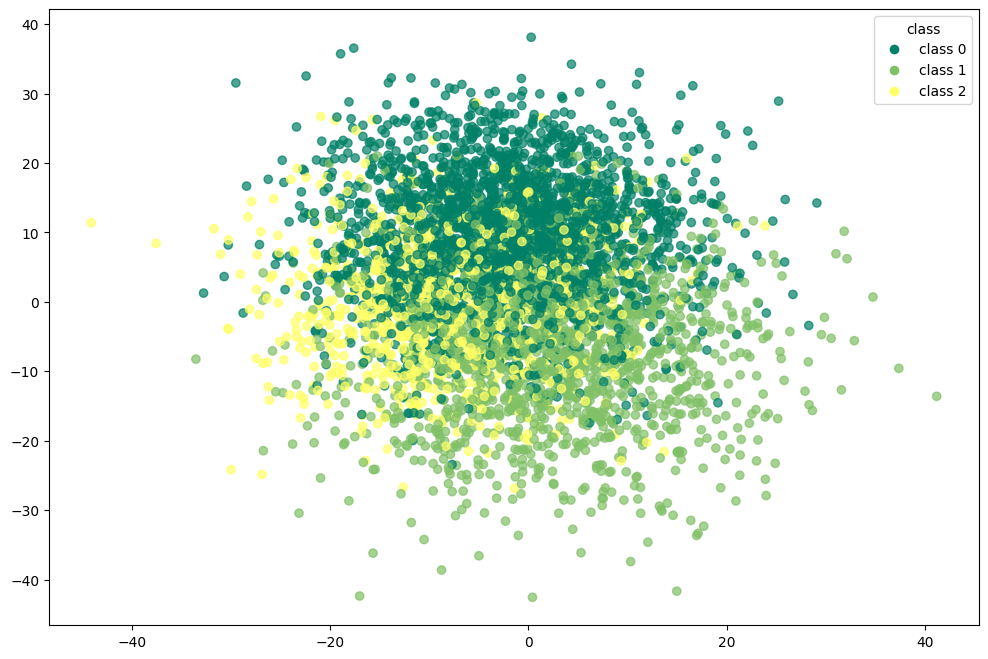

In [344]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

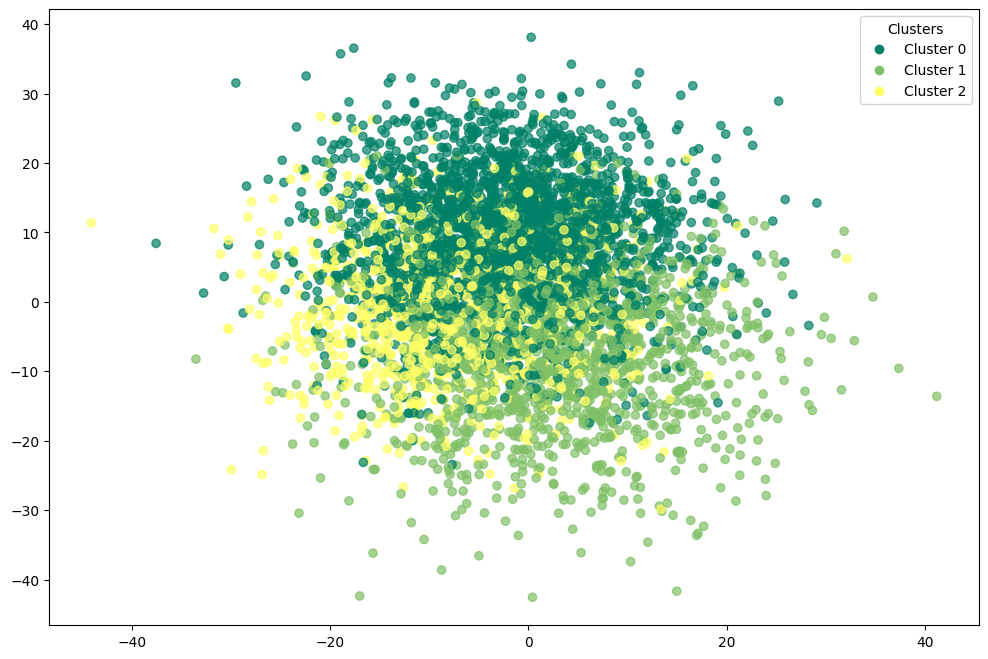

In [345]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [346]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[2478    4   18]
 [  29 1351  120]
 [  27   36  937]]


In [347]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.93      1500
           2       0.87      0.94      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.95      0.95      0.95      5000



In [348]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.89055550507706

In [349]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.8116028652007832

In [350]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.1383267935810352

# overall results

## overall results k-means

### basic

In [351]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2500
           1       0.98      0.91      0.95      1500
           2       0.87      0.97      0.91      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [352]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[2462    6   32]
 [  15 1369  116]
 [  13   21  966]]


### + pca

In [353]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2500
           1       0.98      0.91      0.94      1500
           2       0.86      0.97      0.91      1000

    accuracy                           0.96      5000
   macro avg       0.94      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



In [354]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[2456    7   37]
 [  14 1365  121]
 [  13   21  966]]


### + t-SNE

In [355]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.88      0.53      0.66      2500
           1       0.70      0.95      0.80      1500
           2       0.16      0.23      0.19      1000

    accuracy                           0.60      5000
   macro avg       0.58      0.57      0.55      5000
weighted avg       0.68      0.60      0.61      5000



In [356]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1330    6 1164]
 [  30 1419   51]
 [ 157  608  235]]


### + UMAP

In [357]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.93      1500
           2       0.87      0.94      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.95      0.95      0.95      5000



In [358]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[2478    4   18]
 [  29 1343  128]
 [  27   33  940]]


## overall results trimmed k-means

### basic

In [359]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2398
           1       0.97      0.92      0.95      1144
           2       0.89      0.97      0.93       958

    accuracy                           0.97      4500
   macro avg       0.95      0.96      0.95      4500
weighted avg       0.97      0.97      0.97      4500



In [360]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[2362    6   30]
 [   8 1056   80]
 [  11   22  925]]


### + pca

In [361]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66      2480
           1       0.68      0.99      0.81      1335
           2       0.05      0.10      0.07       685

    accuracy                           0.58      4500
   macro avg       0.57      0.53      0.51      4500
weighted avg       0.75      0.58      0.61      4500



In [362]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1227   15 1238]
 [   6 1320    9]
 [  11  603   71]]


### + t-SNE

In [363]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.84      0.50      0.63      2232
           1       0.71      0.96      0.82      1344
           2       0.15      0.21      0.17       924

    accuracy                           0.58      4500
   macro avg       0.56      0.56      0.54      4500
weighted avg       0.66      0.58      0.59      4500



In [364]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1117    5 1110]
 [  25 1294   25]
 [ 195  532  197]]


### + UMAP

In [365]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2485
           1       0.98      0.87      0.92      1483
           2       0.74      0.92      0.82       532

    accuracy                           0.94      4500
   macro avg       0.90      0.93      0.91      4500
weighted avg       0.95      0.94      0.95      4500



In [366]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[2478    4    3]
 [  29 1283  171]
 [  27   16  489]]


## overall results GMM

### basic

In [367]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.72      0.96      0.82      2500
           1       0.95      0.93      0.94      1500
           2       0.20      0.04      0.07      1000

    accuracy                           0.77      5000
   macro avg       0.63      0.64      0.61      5000
weighted avg       0.69      0.77      0.71      5000



In [368]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[2399    1  100]
 [  40 1391   69]
 [ 889   68   43]]


### + pca

In [369]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2500
           1       0.97      0.94      0.96      1500
           2       0.90      0.95      0.93      1000

    accuracy                           0.97      5000
   macro avg       0.95      0.96      0.96      5000
weighted avg       0.97      0.97      0.97      5000



In [370]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[2464    6   30]
 [  15 1412   73]
 [  13   36  951]]


### + t-SNE

In [371]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.81      0.45      0.58      2500
           1       0.85      0.79      0.82      1500
           2       0.26      0.58      0.36      1000

    accuracy                           0.58      5000
   macro avg       0.64      0.61      0.59      5000
weighted avg       0.72      0.58      0.61      5000



In [372]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1131    2 1367]
 [  40 1191  269]
 [ 218  203  579]]


### + UMAP

In [373]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.94      1500
           2       0.87      0.94      0.91      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.96      0.95      0.95      5000



In [374]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[2479    4   17]
 [  29 1351  120]
 [  27   33  940]]


## overall results pam

### basic

In [375]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1222   22 1256]
 [  13 1365  122]
 [  21  487  492]]


In [376]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.97      0.49      0.65      2500
           1       0.73      0.91      0.81      1500
           2       0.26      0.49      0.34      1000

    accuracy                           0.62      5000
   macro avg       0.65      0.63      0.60      5000
weighted avg       0.76      0.62      0.64      5000



### + pca

In [377]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[2450    7   43]
 [  12 1341  147]
 [   8   18  974]]


In [378]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      2500
           1       0.98      0.89      0.94      1500
           2       0.84      0.97      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.95      0.94      5000
weighted avg       0.96      0.95      0.95      5000



### + t-SNE

In [379]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1770   11  719]
 [  20 1322  158]
 [  80  449  471]]


In [380]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.95      0.71      0.81      2500
           1       0.74      0.88      0.81      1500
           2       0.35      0.47      0.40      1000

    accuracy                           0.71      5000
   macro avg       0.68      0.69      0.67      5000
weighted avg       0.77      0.71      0.73      5000



### + umap

In [381]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[2478    4   18]
 [  29 1345  126]
 [  27   33  940]]


In [382]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.93      1500
           2       0.87      0.94      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.95      0.95      0.95      5000



## overall results spectral clustering

### basic

In [383]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[2479    7   14]
 [  27 1386   87]
 [  36   45  919]]


In [384]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.96      0.92      0.94      1500
           2       0.90      0.92      0.91      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.94      0.95      5000
weighted avg       0.96      0.96      0.96      5000



### + pca

In [385]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[2455    6   39]
 [  17 1390   93]
 [  17   28  955]]


In [386]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      2500
           1       0.98      0.93      0.95      1500
           2       0.88      0.95      0.92      1000

    accuracy                           0.96      5000
   macro avg       0.95      0.95      0.95      5000
weighted avg       0.96      0.96      0.96      5000



### + t-SNE

In [387]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[1304    5 1191]
 [  55 1355   90]
 [ 261  443  296]]


In [388]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       0.80      0.52      0.63      2500
           1       0.75      0.90      0.82      1500
           2       0.19      0.30      0.23      1000

    accuracy                           0.59      5000
   macro avg       0.58      0.57      0.56      5000
weighted avg       0.67      0.59      0.61      5000



### + umap

In [389]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[2478    4   18]
 [  29 1351  120]
 [  27   36  937]]


In [390]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2500
           1       0.97      0.90      0.93      1500
           2       0.87      0.94      0.90      1000

    accuracy                           0.95      5000
   macro avg       0.94      0.94      0.94      5000
weighted avg       0.95      0.95      0.95      5000



# external measures - overall results 

## k-means

In [391]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [392]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.905
NMI: 0.835
Silhouette: 0.139


## k-means + pca

In [393]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [394]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.900
NMI: 0.829
Silhouette: 0.139


## k-means + tsne

In [395]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [396]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.406
NMI: 0.447
Silhouette: 0.049


## k-means + umap

In [397]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [398]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.889
NMI: 0.810
Silhouette: 0.138


##  trimmed k-means 

In [399]:
scores = evaluate_clustering(df_trim_kmeans.drop(['target','trim_kmeans'],axis=1).values, df_trim_kmeans['target'], df_trim_kmeans['trim_kmeans'])

In [400]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.920
NMI: 0.848
Silhouette: 0.149


## trimmed k-means + pca

In [401]:
scores = evaluate_clustering(df_pca_trim_kmeans.drop(['target','trim_kmeans_pca'],axis=1).values, df_pca_trim_kmeans['target'], df_pca_trim_kmeans['trim_kmeans_pca'])

In [402]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.464
NMI: 0.579
Silhouette: 0.068


## trimmed k-means + tsne

In [403]:
scores = evaluate_clustering(df_tsne_trim_kmeans.drop(['target','trim_kmeans_tsne'],axis=1).values, df_tsne_trim_kmeans['target'], df_tsne_trim_kmeans['trim_kmeans_tsne'])

In [404]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.408
NMI: 0.453
Silhouette: 0.054


## trimmed k-means + umap

In [405]:
scores = evaluate_clustering(df_umap_trim_kmeans.drop(['target','trim_kmeans_umap'],axis=1).values, df_umap_trim_kmeans['target'], df_umap_trim_kmeans['trim_kmeans_umap'])

In [406]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.889
NMI: 0.800
Silhouette: 0.139


## GMM

In [407]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [408]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.547
NMI: 0.559
Silhouette: 0.097


## GMM + pca

In [409]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [410]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.917
NMI: 0.847
Silhouette: 0.136


## GMM + tsne

In [411]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [412]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.297
NMI: 0.337
Silhouette: 0.031


## GMM + umap

In [413]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [414]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.892
NMI: 0.814
Silhouette: 0.138


## pam

In [415]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [416]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.375
NMI: 0.434
Silhouette: 0.054


## pam + pca

In [417]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [418]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.891
NMI: 0.822
Silhouette: 0.139


## pam + tsne

In [419]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [420]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.455
NMI: 0.444
Silhouette: 0.058


## pca + umap

In [421]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [422]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.889
NMI: 0.811
Silhouette: 0.138


## spectral clustering

In [423]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [424]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.896
NMI: 0.816
Silhouette: 0.139


## spectral clustering + pca

In [425]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [426]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.903
NMI: 0.830
Silhouette: 0.138


## spectral clustering + tsne

In [427]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [428]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.372
NMI: 0.391
Silhouette: 0.043


## spectral clustering + umap

In [429]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [430]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.891
NMI: 0.812
Silhouette: 0.138


# final output

In [431]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# trimmed k-means
evaluate_and_store("trimmed k-means",
                   df_trim_kmeans.drop(['target','trim_kmeans'],axis=1).values,
                   df_trim_kmeans['target'], df_trim_kmeans['trim_kmeans'])

evaluate_and_store("trimmed k-means + pca",
                   df_pca_trim_kmeans.drop(['target','trim_kmeans_pca'],axis=1).values,
                   df_pca_trim_kmeans['target'], df_pca_trim_kmeans['trim_kmeans_pca'])

evaluate_and_store("trimmed k-means + tsne",
                   df_tsne_trim_kmeans.drop(['target','trim_kmeans_tsne'],axis=1).values,
                   df_tsne_trim_kmeans['target'], df_tsne_trim_kmeans['trim_kmeans_tsne'])

evaluate_and_store("trimmed k-means + umap",
                   df_umap_trim_kmeans.drop(['target','trim_kmeans_umap'],axis=1).values,
                   df_umap_trim_kmeans['target'], df_umap_trim_kmeans['trim_kmeans_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.905  0.835       0.139
k-means + pca               0.900  0.829       0.139
k-means + tsne              0.406  0.447       0.049
k-means + umap              0.889  0.810       0.138
trimmed k-means             0.920  0.848       0.149
trimmed k-means + pca       0.464  0.579       0.068
trimmed k-means + tsne      0.408  0.453       0.054
trimmed k-means + umap      0.889  0.800       0.139
GMM                         0.547  0.559       0.097
GMM + pca                   0.917  0.847       0.136
GMM + tsne                  0.297  0.337       0.031
GMM + umap                  0.892  0.814       0.138
PAM                         0.375  0.434       0.054
PAM + pca                   0.891  0.822       0.139
PAM + tsne                  0.455  0.444       0.058
PAM + umap                  0.889  0.811       0.138
Spectral Clustering         0.896  0.816       0.139
Spectral Clustering + pca   0.903  0.830      

In [ ]:
if N_SAMPLE == 5000 and N_FEATURES == 20:
    folder = "5000_20"
elif N_SAMPLE == 10000 and N_FEATURES == 10:
    folder = "10000_10"
elif N_SAMPLE == 20000 and N_FEATURES == 5:
    folder = "20000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)